<a href="https://colab.research.google.com/github/torchflash/MMAI831-AIOS-Assignment/blob/main/Irene_Marketing_ad16_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports & Data Download

In [1]:
from pathlib import Path
from fastcore.all import *
import numpy as np
import pandas as pd
from pprint import pprint
from PIL import Image
import matplotlib.pyplot as plt
import pdb
from collections import OrderedDict, defaultdict

In [2]:
! pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ingugi","key":"f030f1dc6155a262affa6c9ce6f41fd4"}'}

In [3]:
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

In [4]:
! chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d groffo/ads16-dataset

 99% 1.46G/1.47G [00:19<00:00, 73.2MB/s]
100% 1.47G/1.47G [00:19<00:00, 81.1MB/s]


In [6]:
! unzip ads16-dataset.zip
! unzip ADS16_Benchmark_part2/Ads.zip
! unzip ADS16_Benchmark_part2/Corpus.zip
! unzip ADS16_Benchmark_part2/Documents.zip

Streaming output truncated to the last 5000 lines.
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0010/U0010-PREF.csv  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0010/U0010-RT.csv  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0011/U0011-B5.csv  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0011/U0011-IM-NEG.csv  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0011/U0011-IM-NEG/1.png  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0011/U0011-IM-NEG/1_th_1445453970.png  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0011/U0011-IM-NEG/2.png  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0011/U0011-IM-NEG/2_th_1445454004.png  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/Corpus/Corpus/U0011/U0011-IM-NEG/3.png  
  inflating: ADS16_Benchmark_part1/ADS16_Benchmark_part1/

In [7]:
! mkdir Advertising_Dataset  


In [8]:
import os
import shutil

source_folder1 = '/content/ADS16_Benchmark_part1'
source_folder2 = '/content/ADS16_Benchmark_part2'
extracted_folder = 'Advertising_Dataset'

# Create the extracted files folder if it doesn't already exist
if not os.path.exists(extracted_folder):
    os.makedirs(extracted_folder)

# Move or copy files from the first source folder to the extracted folder
for file_name in os.listdir(source_folder1):
    source_path = os.path.join(source_folder1, file_name)
    destination_path = os.path.join(extracted_folder, file_name)
    shutil.move(source_path, destination_path)  # or shutil.copy()

# Move or copy files from the second source folder to the extracted folder
for file_name in os.listdir(source_folder2):
    source_path = os.path.join(source_folder2, file_name)
    destination_path = os.path.join(extracted_folder, file_name)
    shutil.move(source_path, destination_path)  # or shutil.copy()


In [73]:
def move_unzipped_files(source_folder, destination_folder):
    # Create the destination folder if it doesn't exist
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)

    # Get a list of all files in the source folder
    file_list = os.listdir(source_folder)

    # Iterate over each file in the source folder
    for file_name in file_list:
        # Construct the full path of the file
        file_path = os.path.join(source_folder, file_name)

        # Check if the file is a regular file (not a directory) and move it to the destination folder
        if os.path.isfile(file_path):
            shutil.move(file_path, os.path.join(destination_folder, file_name))

# move files
source_folder = "/content/Advertising_Dataset"
destination_folder = "Unzipped_Advertising_Dataset"

move_unzipped_files(source_folder, destination_folder)


In [74]:
#see list of ad and corpus folders
main = '/content/Advertising_Dataset'

part1 = '/content/Advertising_Dataset/ADS16_Benchmark_part1'
part2 = '/content/Advertising_Dataset/ADS16_Benchmark_part2'

ads_p1 = '/content/Advertising_Dataset/ADS16_Benchmark_part1/Ads/Ads'  
corpus_p1 = '/content/Advertising_Dataset/ADS16_Benchmark_part1/Corpus/Corpus'
ads_p2 = '/content/Advertising_Dataset/ADS16_Benchmark_part2/Ads/Ads'
corpus_p2 = '/content/Advertising_Dataset/ADS16_Benchmark_part2/Corpus/Corpus'

ads_l = sorted(os.listdir(ads_p1) + os.listdir(ads_p2))
corpus_l = sorted(os.listdir(corpus_p1) + os.listdir(corpus_p2))


In [75]:
#Print contents of Ads directory
print(ads_l)

['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '3', '4', '5', '6', '7', '8', '9']


In [76]:
#Print contents of Corpus directory
print(corpus_l)

['U0001', 'U0002', 'U0003', 'U0004', 'U0005', 'U0006', 'U0007', 'U0008', 'U0009', 'U0010', 'U0011', 'U0012', 'U0013', 'U0014', 'U0015', 'U0016', 'U0017', 'U0018', 'U0019', 'U0020', 'U0021', 'U0022', 'U0023', 'U0024', 'U0025', 'U0026', 'U0027', 'U0028', 'U0029', 'U0030', 'U0031', 'U0032', 'U0033', 'U0034', 'U0035', 'U0036', 'U0037', 'U0038', 'U0039', 'U0040', 'U0041', 'U0042', 'U0043', 'U0044', 'U0045', 'U0046', 'U0047', 'U0048', 'U0049', 'U0050', 'U0051', 'U0052', 'U0053', 'U0054', 'U0055', 'U0056', 'U0057', 'U0058', 'U0059', 'U0060', 'U0061', 'U0062', 'U0063', 'U0064', 'U0065', 'U0066', 'U0067', 'U0068', 'U0069', 'U0070', 'U0071', 'U0072', 'U0073', 'U0074', 'U0075', 'U0076', 'U0077', 'U0078', 'U0079', 'U0080', 'U0081', 'U0082', 'U0083', 'U0084', 'U0085', 'U0086', 'U0087', 'U0088', 'U0089', 'U0090', 'U0091', 'U0092', 'U0093', 'U0094', 'U0095', 'U0096', 'U0097', 'U0098', 'U0099', 'U0100', 'U0101', 'U0102', 'U0103', 'U0104', 'U0105', 'U0106', 'U0107', 'U0108', 'U0109', 'U0110', 'U0111', 

In [77]:
main_folder_path1 = "/content/Advertising_Dataset/ADS16_Benchmark_part1/Ads/Ads"
main_folder_path2 = "/content/Advertising_Dataset/ADS16_Benchmark_part2/Ads/Ads"
image_extensions = [".jpg", ".jpeg", ".png", ".gif"]

Ad_total_image_count = sum(
    1 for root, dirs, files in os.walk(main_folder_path1) for file in files
    if any(file.lower().endswith(ext) for ext in image_extensions)
) + sum(
    1 for root, dirs, files in os.walk(main_folder_path2) for file in files
    if any(file.lower().endswith(ext) for ext in image_extensions)
)

total_image_count1 = sum(1 for root, dirs, files in os.walk('/content/Advertising_Dataset/ADS16_Benchmark_part1/Ads/Ads' ) for file in files
    if any(file.lower().endswith(ext) for ext in image_extensions)
)
total_image_count2 = sum(1 for root, dirs, files in os.walk('/content/Advertising_Dataset/ADS16_Benchmark_part2/Ads/Ads' ) for file in files
    if any(file.lower().endswith(ext) for ext in image_extensions)
)


print("Total Ad_images:", Ad_total_image_count)
print("Number of Ad_images Part1:", total_image_count1)
print("Number of Ad_images Part2:", total_image_count2)

Total Ad_images: 301
Number of Ad_images Part1: 151
Number of Ad_images Part2: 150


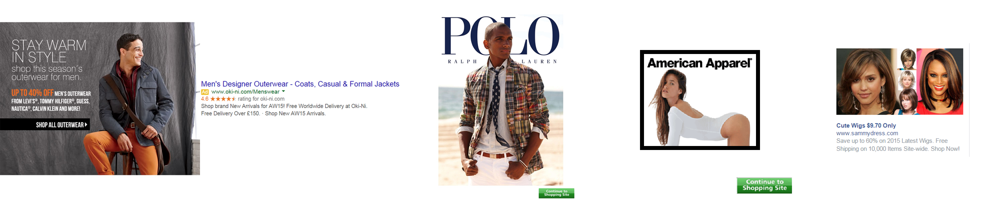

In [78]:
#print images of ads

folder_path = '/content/Advertising_Dataset/ADS16_Benchmark_part1/Ads/Ads/1'

def resize_and_display_images(folder_path, target_size=(600, 600), max_images=5):
    images = []

    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(('.jpg', '.png')):  
                image_path = os.path.join(root, file)
                image = Image.open(image_path)
                image = image.resize(target_size)
                images.append(image)

                if len(images) >= max_images:
                    break

        if len(images) >= max_images:
            break

    # Calculate the total width for displaying the images side by side
    total_width = len(images) * target_size[0]
    new_image = Image.new('RGB', (total_width, target_size[1]))

    # Paste the resized images side by side in the new image
    x_offset = 0
    for image in images:
        new_image.paste(image, (x_offset, 0))
        x_offset += target_size[0]

    new_image.show()

resize_and_display_images(folder_path, max_images=5)



In [79]:
# get idea of what is in corpus folders

# Specify the path to the nested folder containing the sample_corpus folder
nested_folder_path = '/content/Advertising_Dataset/ADS16_Benchmark_part1/Corpus/Corpus/U0001'

# Construct the full path to the sample_corpus folder
sample_corpus_path = Path(nested_folder_path) / '/content/Advertising_Dataset/ADS16_Benchmark_part1/Corpus/Corpus/U0001'

for file_path in sample_corpus_path.iterdir():
    if file_path.suffix == ".csv":
        df_temp = pd.read_csv(file_path, sep=";", header=0, nrows=25)
        print(f"\n[INFO] Printing some contents of {file_path.name}: \n")
        df_temp.head(25)



[INFO] Printing some contents of U0001-IM-POS.csv: 



,fave1,fave2,fave3,fave4,fave5
0,U0001-IM-POS/1.png,U0001-IM-POS/2.png,U0001-IM-POS/3.png,U0001-IM-POS/4.png,U0001-IM-POS/5.png
1,my cats,my cats,movie we are in,tv show we are in,movie we are in



[INFO] Printing some contents of U0001-INF.csv: 



,Name,Last Name,Gender,Age,Paypal,Type of Job,Weekly working hours,Income,Home country,Home town,Cap/Zip-Code,Timepass,Countries visited,Fave Sports
0,Hidden,Hidden,F,62,hidden@comcast.net,Housewife/Househusband,Full Time,1,United States of America,Apollo,15613,Internet,United States of America,I do not like Sports



[INFO] Printing some contents of U0001-RT.csv: 



,Cat0,Cat1,Cat2,Cat3,Cat4,Cat5,Cat6,Cat7,Cat8,Cat9,Cat10,Cat11,Cat12,Cat13,Cat14,Cat15,Cat16,Cat17,Cat18,Cat19
0,Clothing & Shoes,Automotive,Baby Products,Health & Beauty,Media (BMVD),Consumer Electronics,Console & Video Games,DIY & Tools,Garden & Outdoor living,Grocery,Kitchen & Home,Betting,Jewellery & Watches,Musical Instruments,Office Products,Pet Supplies,Computer Software,Sports & Outdoors,Toys & Games,Dating Sites
1,"1,1,1,1,1,3,1,1,1,1,1,1,1,1,1","1,1,1,1,1,1,1,1,1,1,1,1,1,1,1","2,1,1,1,3,1,1,1,1,1,1,1,1,1,1","1,1,1,3,1,1,1,1,1,1,1,2,2,2,1","1,1,1,1,1,1,1,1,1,1,1,1,1,1,1","1,2,1,1,1,3,1,1,1,1,1,1,1,1,3","1,1,1,1,1,1,1,1,1,1,1,1,1,1,1","1,1,2,1,1,1,1,1,1,1,1,1,1,1,1","1,2,1,2,1,1,1,3,1,1,3,1,1,1,1","1,1,2,1,1,1,1,1,1,1,1,2,2,1,2","1,1,1,1,1,1,1,1,1,1,1,3,1,1,1","1,1,1,1,1,1,1,1,1,1,1,1,1,1,1","1,3,1,2,1,1,1,1,1,1,1,1,1,1,1","1,1,1,1,1,1,1,1,1,1,3,1,1,1,1","1,3,4,1,2,1,1,1,1,1,1,1,1,2,3","3,2,3,3,2,1,1,2,1,1,1,2,1,2,3","1,1,1,1,1,1,1,1,1,1,1,2,1,1,1","2,1,1,1,1,1,1,3,1,1,1,1,2,1,1","1,3,1,3,2,1,1,1,1,1,1,1,1,1,1","1,1,1,1,1,1,1,1,1,1,1,1,1,1,1"



[INFO] Printing some contents of U0001-IM-NEG.csv: 



,unfave1,unfave2,unfave3,unfave4,unfave5
0,U0001-IM-NEG/1.png,U0001-IM-NEG/2.png,U0001-IM-NEG/3.png,U0001-IM-NEG/4.png,U0001-IM-NEG/5.png
1,news headlines,homelessness,violence,war,human rights



[INFO] Printing some contents of U0001-B5.csv: 



,Question#,Answer
0,1,1
1,2,2
2,3,-2
3,4,0
4,5,-1
5,6,0
6,7,-2
7,8,2
8,9,-1
9,10,1



[INFO] Printing some contents of U0001-PREF.csv: 



,Most visited websites,Most listened musics,Most watched movies,Most watched tv programmes,Most read books
0,"Media (Books, DVD, CD/DVD Music) sites, Grocer...","Classical Music, Easy Listening, Jazz","Action, Thriller, Drama, Comedy, Mystery","Comedy, Drama",Mystery


<BarContainer object of 3 artists>

Text(0.5, 0, 'Music Genres')

Text(0, 0.5, 'Number of Listeners')

Text(0.5, 1.0, 'Most Listened Musics')

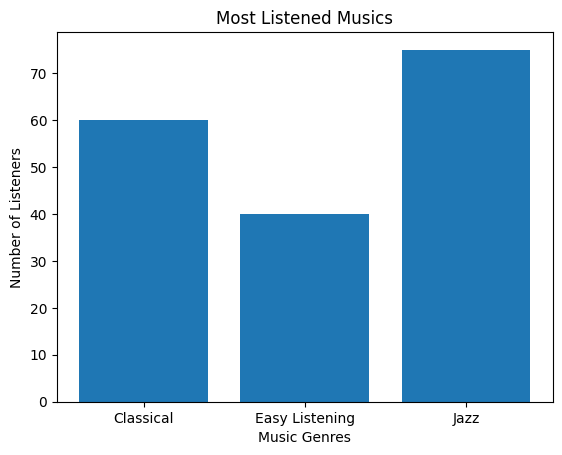

<BarContainer object of 5 artists>

Text(0.5, 0, 'Movie Genres')

Text(0, 0.5, 'Number of Views')

Text(0.5, 1.0, 'Most Watched Movies')

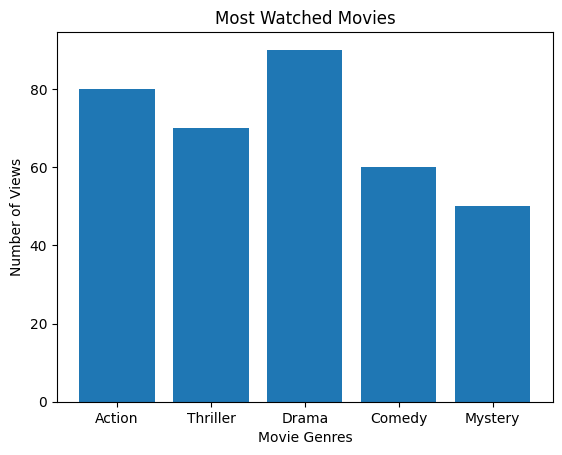

In [100]:
music_genres = ['Classical', 'Easy Listening', 'Jazz']
listeners = [60, 40, 75]

plt.bar(music_genres, listeners)
plt.xlabel('Music Genres')
plt.ylabel('Number of Listeners')
plt.title('Most Listened Musics')
plt.show()

movies = ['Action', 'Thriller', 'Drama', 'Comedy', 'Mystery']
watched_counts = [80, 70, 90, 60, 50]

plt.bar(movies, watched_counts)
plt.xlabel('Movie Genres')
plt.ylabel('Number of Views')
plt.title('Most Watched Movies')
plt.show()

In [80]:
# get idea of what is in the corpus folders 

def process_files_in_folder(folder_path):
    for file_path in folder_path.iterdir():
        if file_path.is_file() and file_path.suffix == ".csv":
            df_temp = pd.read_csv(file_path, sep=";", header=0, nrows=25)
            print(f"\n[INFO] Printing some contents of {file_path.name}: \n")
            print(df_temp.head(25))
        elif file_path.is_dir():
            process_files_in_folder(file_path)

# Specify the root folder containing the nested folders
root_folder_path = '/content/Advertising_Dataset/ADS16_Benchmark_part1/Corpus'

# Construct the Path object for the root folder
root_folder = Path(root_folder_path)

# Start processing the files in the root folder and its subfolders
process_files_in_folder(root_folder)


Streaming output truncated to the last 5000 lines.
  Weekly working hours  Income Home country       Home town  Cap/Zip-Code  \
0            Part Time       2     Slovenia  Slovenj Gradec          2380   

   Timepass Countries visited       Fave Sports  
0  Internet           Austria  Endurance sports  

[INFO] Printing some contents of U0013-PREF.csv: 

                       Most visited websites    Most listened musics  \
0  Computer software sites, Automotive sites  Rock, Electronic Music   

                    Most watched movies Most watched tv programmes  \
0  Thriller, Comedy, Crime and Gangster                      Drama   

       Most read books  
0  Satire, Biographies  

[INFO] Printing some contents of U0013-IM-POS.csv: 

                fave1                fave2                    fave3  \
0  U0013-IM-POS/1.png   U0013-IM-POS/2.png       U0013-IM-POS/3.png   
1      calculator, TI  laptop, HP, Probook  phone, Sony, Xperia, Z1   

                               fave4  

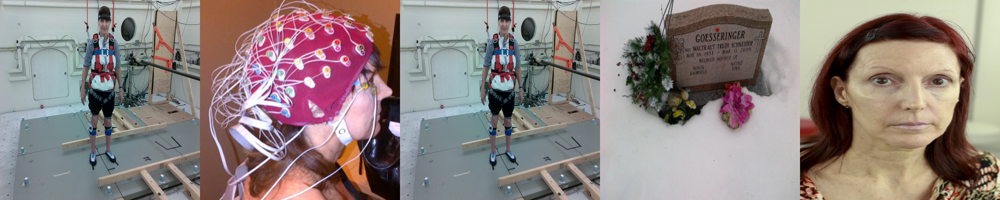

In [97]:
#print images of ads

folder_path = '/content/Advertising_Dataset/ADS16_Benchmark_part1/Corpus/Corpus/U0058'


def resize_and_display_images(folder_path, target_size=(600, 600), max_images=5):
    images = []

    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(('.jpg', '.png')):  
                image_path = os.path.join(root, file)
                image = Image.open(image_path)
                image = image.resize(target_size)
                images.append(image)

                if len(images) >= max_images:
                    break

        if len(images) >= max_images:
            break

    # Calculate the total width for displaying the images side by side
    total_width = len(images) * target_size[0]
    new_image = Image.new('RGB', (total_width, target_size[1]))

    # Paste the resized images side by side in the new image
    x_offset = 0
    for image in images:
        new_image.paste(image, (x_offset, 0))
        x_offset += target_size[0]

    new_image.show()

resize_and_display_images(folder_path, max_images=5)


In [81]:
import nltk

# Download the required resource
nltk.download('vader_lexicon')

from nltk.sentiment import SentimentIntensityAnalyzer

# Initialize the sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Replace 'ads_folder' with the actual path to the folder containing the ad files
for root, dirs, files in os.walk('/content/Advertising_Dataset/ADS16_Benchmark_part1/Ads'):
    for file in files:
        file_path = os.path.join(root, file)
        with open(file_path, 'r', encoding='latin-1') as f:
            ad_text = f.read()
            # Calculate sentiment polarity
            sentiment_scores = sid.polarity_scores(ad_text)
            print(f"Ad: {file}")
            print(f"Sentiment polarity: {sentiment_scores['compound']}")
# see sentiment analysis of Ads in part 1

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

Ad: 11.png
Sentiment polarity: 0.0
Ad: 4.png
Sentiment polarity: 0.8413
Ad: 13.png
Sentiment polarity: 0.8299
Ad: 14.png
Sentiment polarity: 0.0
Ad: 6.png
Sentiment polarity: 0.0
Ad: 15.png
Sentiment polarity: 0.6283
Ad: 5.png
Sentiment polarity: 0.0
Ad: 12.png
Sentiment polarity: 0.0
Ad: 8.png
Sentiment polarity: 0.0
Ad: 10.png
Sentiment polarity: 0.0
Ad: 7.png
Sentiment polarity: 0.0
Ad: 9.png
Sentiment polarity: 0.0
Ad: 1.png
Sentiment polarity: 0.0
Ad: 2.png
Sentiment polarity: 0.6869
Ad: 3.png
Sentiment polarity: 0.0
Ad: 11.png
Sentiment polarity: 0.0
Ad: 4.png
Sentiment polarity: 0.0
Ad: 13.png
Sentiment polarity: 0.0
Ad: 14.png
Sentiment polarity: -0.8612
Ad: 6.png
Sentiment polarity: 0.0
Ad: 15.png
Sentiment polarity: 0.6628
Ad: 5.png
Sentiment polarity: 0.0
Ad: 12.png
Sentiment polarity: 0.9123
Ad: 8.png
Sentiment polarity: 0.0
Ad: 10.png
Sentiment polarity: 0.0
Ad: 7.png
Sentiment polarity: 0.6031
Ad: 9.png
Sentiment polarity: 0.7736
Ad: 1.png
Sentiment polarity: 0.0
Ad: 2.pn

In [82]:
import nltk

# Download the required resource
nltk.download('vader_lexicon')

from nltk.sentiment import SentimentIntensityAnalyzer

# Initialize the sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Replace 'ads_folder' with the actual path to the folder containing the ad files
for root, dirs, files in os.walk('/content/Advertising_Dataset/ADS16_Benchmark_part2/Ads'):
    for file in files:
        file_path = os.path.join(root, file)
        with open(file_path, 'r', encoding='latin-1') as f:
            ad_text = f.read()
            # Calculate sentiment polarity
            sentiment_scores = sid.polarity_scores(ad_text)
            print(f"Ad: {file}")
            print(f"Sentiment polarity: {sentiment_scores['compound']}")
# see sentiment analysis of Ads in part 2

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

Ad: 11.png
Sentiment polarity: 0.0
Ad: 4.png
Sentiment polarity: 0.0
Ad: 13.png
Sentiment polarity: 0.6402
Ad: 14.png
Sentiment polarity: 0.7374
Ad: 6.png
Sentiment polarity: 0.0
Ad: 15.png
Sentiment polarity: 0.7691
Ad: 5.png
Sentiment polarity: 0.6517
Ad: 12.png
Sentiment polarity: 0.0
Ad: 8.png
Sentiment polarity: 0.0
Ad: 10.png
Sentiment polarity: 0.74
Ad: 7.png
Sentiment polarity: 0.7477
Ad: 9.png
Sentiment polarity: 0.0
Ad: 1.png
Sentiment polarity: -0.7623
Ad: 2.png
Sentiment polarity: 0.0
Ad: 3.png
Sentiment polarity: 0.6402
Ad: 11.png
Sentiment polarity: 0.0
Ad: 4.png
Sentiment polarity: 0.0
Ad: 13.png
Sentiment polarity: -0.7882
Ad: 14.png
Sentiment polarity: 0.0
Ad: 6.png
Sentiment polarity: 0.0
Ad: 15.png
Sentiment polarity: 0.7713
Ad: 5.png
Sentiment polarity: 0.8299
Ad: 12.png
Sentiment polarity: 0.0
Ad: 8.png
Sentiment polarity: 0.78
Ad: 10.png
Sentiment polarity: 0.6935
Ad: 7.png
Sentiment polarity: 0.0
Ad: 9.png
Sentiment polarity: -0.6031
Ad: 1.png
Sentiment polarity:

In [87]:
import os
import pandas as pd
from collections import OrderedDict

df_list = []  # List to store individual dataframes

corpus_directory = "/content/Advertising_Dataset/ADS16_Benchmark_part1/Corpus/Corpus"

result_d = {}

for root, directories, files in os.walk(corpus_directory):
    for file_name in files:
        file_path = os.path.join(root, file_name)
        if file_path.endswith(".csv"):
            df_temp = pd.read_csv(file_path, sep=";", header=[0])
            if ("INF" in file_name) or ("PREF" in file_name):
                result = df_to_series(df_temp)
            elif "B5" in file_name:
                result = b5_df_to_ocean_series(df_temp)
            elif "IM" in file_name:
                result = pos_neg_df_to_series(df_temp)
            elif "RT" in file_name:
                result = rt_df_to_series(df_temp)
            else:
                print(f"{file_name} not recognized")
            result.to_dict()
            result_d.update(result)

df = pd.DataFrame(result_d, columns=result_d.keys(), index=[0])
df_list.append(df)

# Concatenate all dataframes in the list along the columns axis (axis=1)
df_concatenated = pd.concat(df_list, axis=1)

# Create a separate copy of the concatenated dataframe
new_df = df_concatenated.copy()

new_df.head()


{'fave1_location': 'U0002-IM-POS/1.png',
 'fave1_reason': 'grouptherapy aboveandbeyond music album',
 'fave2_location': 'U0002-IM-POS/2.png',
 'fave2_reason': 'deadmau5 joel music edm',
 'fave3_location': 'U0002-IM-POS/3.png',
 'fave3_reason': 'rainbow flag pride',
 'fave4_location': 'U0002-IM-POS/4.png',
 'fave4_reason': 'sports balls basketball puck birdie',
 'fave5_location': 'U0002-IM-POS/5.png',
 'fave5_reason': 'lion leo animal'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 21,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'Canada',
 'Home town': 'Toronto',
 'Cap/Zip-Code': 'M3J0G6',
 'Timepass': 'Sports',
 'Countries visited': 'Vietnam, Cuba, United States of America, Thailand, Australia, Bahamas, Italy, Spain, France, Canada',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports, Olympic sports\u200e, Winter sports, Other'}

{'Most visited websites': 'Consumer electronics sites',
 'Most listened musics': 'Electronic Music, Indie Pop, Pop (Popular music), Dance Music',
 'Most watched movies': 'Adventure, Action, Thriller, Comedy, Romance',
 'Most watched tv programmes': 'Comedy, Drama, Entertainment (Variety Shows), Sport',
 'Most read books': 'Erotic fiction, Romance'}

{'unfave1_location': 'U0002-IM-NEG/1.png',
 'unfave1_reason': 'food ginger',
 'unfave2_location': 'U0002-IM-NEG/2.png',
 'unfave2_reason': 'food tofu',
 'unfave3_location': 'U0002-IM-NEG/3.png',
 'unfave3_reason': 'birds',
 'unfave4_location': 'U0002-IM-NEG/4.png',
 'unfave4_reason': 'food sushi fish',
 'unfave5_location': 'U0002-IM-NEG/5.png',
 'unfave5_reason': 'donald trump'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 2,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 2,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 9, 'A_score': 7, 'C_score': 6, 'N_score': 4, 'O_score': 8}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 18,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'Eleanor',
 'Cap/Zip-Code': 25070,
 'Timepass': 'Music',
 'Countries visited': 'United States of America',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) '}

{'unfave1_location': 'U0008-IM-NEG/1.png',
 'unfave1_reason': 'Bug',
 'unfave2_location': 'U0008-IM-NEG/2.png',
 'unfave2_reason': 'Foot',
 'unfave3_location': 'U0008-IM-NEG/3.png',
 'unfave3_reason': 'Worms',
 'unfave4_location': 'U0008-IM-NEG/4.png',
 'unfave4_reason': 'Skull',
 'unfave5_location': 'U0008-IM-NEG/5.png',
 'unfave5_reason': 'Chicken'}

{'Most visited websites': 'Console &amp; video games sites, Clothing &amp; shoes sites, Toys &amp; games sites',
 'Most listened musics': 'Hip Hop - Rap, Rock, Dance Music',
 'Most watched movies': 'Comedy, Horror',
 'Most watched tv programmes': 'Comedy',
 'Most read books': 'Mystery, Horror, Cookbooks'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 5,
 'Cat1_2': 5,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 5,
 'Cat1_6': 1,
 'Cat1_7': 5,
 'Cat1_8': 5,
 'Cat1_9': 2,
 'Cat1_10': 1,
 'Cat1_11': 2,
 'Cat1_12': 3,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 5,
 'Cat2_1': 2,
 'Cat2_2': 4,
 'Cat2_3': 3,
 'Cat2_4': 5,
 'Cat2_5': 2,
 'Cat2_6': 4,
 'Cat2_7': 3,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 4,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 3,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 2,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 5,
 'Cat3_9': 2,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 2,
 'Cat4_2': 4,
 'Cat4_3': 4,
 'Cat4_4': 4,
 'Cat4_5': 1,
 'Cat4_6': 2,
 'Cat4_7': 5,
 'Cat4_8': 1,
 'Cat4_9': 3,
 'Cat4_10': 5,
 'Cat4_11': 3,
 'Cat4_12': 4,
 'Cat4_13': 3,
 'Cat4_14': 3,
 'Cat4_15': 1,
 'Cat5_1': 3,
 'Cat5_2': 2,
 'Cat5_3': 5,
 'Cat5_4': 3,
 'Cat5_5': 4,
 'Cat5_6': 3,
 'Cat5_7': 3,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'fave1_location': 'U0008-IM-POS/1.png',
 'fave1_reason': 'Cats',
 'fave2_location': 'U0008-IM-POS/2.png',
 'fave2_reason': 'Tiger',
 'fave3_location': 'U0008-IM-POS/3.png',
 'fave3_reason': 'Bunnies',
 'fave4_location': 'U0008-IM-POS/4.png',
 'fave4_reason': 'Nuts',
 'fave5_location': 'U0008-IM-POS/5.png',
 'fave5_reason': 'Duck'}

{'E_score': 4, 'A_score': 8, 'C_score': 5, 'N_score': 7, 'O_score': 5}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 40,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Plymouth',
 'Cap/Zip-Code': 55447,
 'Timepass': 'Sports',
 'Countries visited': 'United Kingdom',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) '}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 2,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 5,
 'Cat2_2': 5,
 'Cat2_3': 1,
 'Cat2_4': 4,
 'Cat2_5': 5,
 'Cat2_6': 4,
 'Cat2_7': 1,
 'Cat2_8': 4,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 4,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 5,
 'Cat5_2': 5,
 'Cat5_3': 5,
 'Cat5_4': 3,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0052-IM-NEG/1.png',
 'unfave1_reason': 'Snow',
 'unfave2_location': 'U0052-IM-NEG/2.png',
 'unfave2_reason': 'Grass',
 'unfave3_location': 'U0052-IM-NEG/3.png',
 'unfave3_reason': 'Taxes',
 'unfave4_location': 'U0052-IM-NEG/4.png',
 'unfave4_reason': 'Work',
 'unfave5_location': 'U0052-IM-NEG/5.png',
 'unfave5_reason': 'Brocolli'}

{'E_score': 2, 'A_score': 10, 'C_score': 10, 'N_score': 4, 'O_score': 6}

{'fave1_location': 'U0052-IM-POS/1.png',
 'fave1_reason': 'Mexican Soccer team',
 'fave2_location': 'U0052-IM-POS/2.png',
 'fave2_reason': 'IPad Mini 2',
 'fave3_location': 'U0052-IM-POS/3.png',
 'fave3_reason': 'Football',
 'fave4_location': 'U0052-IM-POS/4.png',
 'fave4_reason': 'Pizza',
 'fave5_location': 'U0052-IM-POS/5.png',
 'fave5_reason': 'TV HD'}

{'Most visited websites': 'Sports &amp; outdoor sites, Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Electronic Music',
 'Most watched movies': 'Family, Animation',
 'Most watched tv programmes': 'Comedy, Drama',
 'Most read books': 'Drama, Action and Adventure'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 25,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'United Kingdom',
 'Home town': 'Wallasey',
 'Cap/Zip-Code': 'CH44 4BW',
 'Timepass': 'Reading',
 'Countries visited': 'Spain',
 'Fave Sports': 'I do not like Sports'}

{'fave1_location': 'U0007-IM-POS/1.png',
 'fave1_reason': 'Home Sunset Skyline',
 'fave2_location': 'U0007-IM-POS/2.png',
 'fave2_reason': 'Food Breakfast British',
 'fave3_location': 'U0007-IM-POS/3.png',
 'fave3_reason': 'Ice Cream Chocolate Sweet',
 'fave4_location': 'U0007-IM-POS/4.png',
 'fave4_reason': 'Books Reading Literature',
 'fave5_location': 'U0007-IM-POS/5.png',
 'fave5_reason': 'Movies Disney Stories'}

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites, Dating sites',
 'Most listened musics': 'Classical Music, Pop (Popular music), Opera',
 'Most watched movies': 'Sci-Fi, Adventure, Crime and Gangster, Drama, Musical, Documentary',
 'Most watched tv programmes': 'Drama, Comedy, Factual, News',
 'Most read books': 'Horror, Satire, Science fiction, Autobiographies'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 2,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 3,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 3,
 'Cat5_6': 3,
 'Cat5_7': 2,
 'Cat5_8': 2,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0007-IM-NEG/1.png',
 'unfave1_reason': 'Horror Scary Monster',
 'unfave2_location': 'U0007-IM-NEG/2.png',
 'unfave2_reason': 'Mutant Unnatural Deformed',
 'unfave3_location': 'U0007-IM-NEG/3.png',
 'unfave3_reason': 'Pervert Psychopath Sick',
 'unfave4_location': 'U0007-IM-NEG/4.png',
 'unfave4_reason': 'Badly Cooked Vomit Gross',
 'unfave5_location': 'U0007-IM-NEG/5.png',
 'unfave5_reason': 'Disease Contagious Death'}

{'E_score': 7, 'A_score': 8, 'C_score': 7, 'N_score': 8, 'O_score': 10}

{'fave1_location': 'U0038-IM-POS/1.png',
 'fave1_reason': 'hogwarts letter',
 'fave2_location': 'U0038-IM-POS/2.png',
 'fave2_reason': "assassin's creed, quote",
 'fave3_location': 'U0038-IM-POS/3.png',
 'fave3_reason': 'brasov, romania, lord of the rings',
 'fave4_location': 'U0038-IM-POS/4.png',
 'fave4_reason': 'national geographic, moss swamp, romania',
 'fave5_location': 'U0038-IM-POS/5.png',
 'fave5_reason': 'victoria of samotrake, sculpture, louvre'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 22,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'Romania',
 'Home town': 'Cluj-Napoca',
 'Cap/Zip-Code': 400288,
 'Timepass': 'Internet',
 'Countries visited': 'France, Germany, Netherlands (Holland, Europe), United Kingdom, Italy, Bulgaria, Hungary, Austria',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) , Skating sports, Water sports'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 3,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 5,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 5,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 4,
 'Cat5_6': 2,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0038-IM-NEG/1.png',
 'unfave1_reason': 'krak des chevalliers, destroyed, rebels',
 'unfave2_location': 'U0038-IM-NEG/2.png',
 'unfave2_reason': 'communist kiss of death, honecker, brezhnerbre',
 'unfave3_location': 'U0038-IM-NEG/3.png',
 'unfave3_reason': 'romanian corrupt prime minister',
 'unfave4_location': 'U0038-IM-NEG/4.png',
 'unfave4_reason': 'trump, worst candidate for U.S. presidency',
 'unfave5_location': 'U0038-IM-NEG/5.png',
 'unfave5_reason': 'dolores umbridge, villain , harry potter'}

{'Most visited websites': 'Console &amp; video games sites, Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Electronic Music, Hip Hop - Rap, Reggae',
 'Most watched movies': 'Comedy, Mystery',
 'Most watched tv programmes': "Comedy, Children's",
 'Most read books': 'Science fiction, Mystery, History, Erotic fiction'}

{'E_score': 4, 'A_score': 6, 'C_score': 6, 'N_score': 4, 'O_score': 7}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 55,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Odd job',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Vancouver',
 'Cap/Zip-Code': '98684-9440',
 'Timepass': 'Reading',
 'Countries visited': 'Philippines',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...)'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 2,
 'Cat1_4': 2,
 'Cat1_5': 3,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 2,
 'Cat2_1': 1,
 'Cat2_2': 3,
 'Cat2_3': 3,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 2,
 'Cat2_12': 2,
 'Cat2_13': 1,
 'Cat2_14': 2,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 2,
 'Cat3_4': 1,
 'Cat3_5': 3,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 2,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 3,
 'Cat4_6': 3,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 2,
 'Cat4_15': 2,
 'Cat5_1': 3,
 'Cat5_2': 3,
 'Cat5_3': 2,
 'Cat5_4': 2,
 'Cat5_5': 3,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 2,
 'Cat5_9': 1,
 'Cat5_10'

{'fave1_location': 'U0019-IM-POS/1.png',
 'fave1_reason': 'trips to the beach',
 'fave2_location': 'U0019-IM-POS/2.png',
 'fave2_reason': 'watching sunsets',
 'fave3_location': 'U0019-IM-POS/3.png',
 'fave3_reason': 'going flying and watching air shows',
 'fave4_location': 'U0019-IM-POS/4.png',
 'fave4_reason': 'Christmas lights',
 'fave5_location': 'U0019-IM-POS/5.png',
 'fave5_reason': 'watching wildlife'}

{'unfave1_location': 'U0019-IM-NEG/1.png',
 'unfave1_reason': 'burned food',
 'unfave2_location': 'U0019-IM-NEG/2.png',
 'unfave2_reason': 'dirty diapers',
 'unfave3_location': 'U0019-IM-NEG/3.png',
 'unfave3_reason': 'dirty dishes',
 'unfave4_location': 'U0019-IM-NEG/4.png',
 'unfave4_reason': "man's hatred toward another",
 'unfave5_location': 'U0019-IM-NEG/5.png',
 'unfave5_reason': 'eating fish'}

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites, Tools &amp; hardware sites, Computer software sites',
 'Most listened musics': 'Country Music, Easy Listening, Singer - Songwriter (inc. Folk)',
 'Most watched movies': 'Western, Sci-Fi, Epic - Historical, Mystery, Family, Documentary',
 'Most watched tv programmes': 'Factual, Religion &amp; Ethics, News, Learning',
 'Most read books': 'Self help, Guide, Religious, Action and Adventure'}

{'E_score': 6, 'A_score': 9, 'C_score': 9, 'N_score': 4, 'O_score': 8}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 36,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'Louisville',
 'Cap/Zip-Code': 40218,
 'Timepass': 'Sports',
 'Countries visited': 'Australia, Great Britain, New Zealand, Germany, France, Canada, South Africa',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Endurance sports'}

{'unfave1_location': 'U0042-IM-NEG/1.png',
 'unfave1_reason': 'This',
 'unfave2_location': 'U0042-IM-NEG/2.png',
 'unfave2_reason': 'is',
 'unfave3_location': 'U0042-IM-NEG/3.png',
 'unfave3_reason': 'a',
 'unfave4_location': 'U0042-IM-NEG/4.png',
 'unfave4_reason': 'crazy',
 'unfave5_location': 'U0042-IM-NEG/5.png',
 'unfave5_reason': 'request'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 3,
 'Cat1_8': 3,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 4,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 3,
 'Cat3_7': 1,
 'Cat3_8': 2,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 2,
 'Cat5_3': 4,
 'Cat5_4': 2,
 'Cat5_5': 1,
 'Cat5_6': 2,
 'Cat5_7': 1,
 'Cat5_8': 3,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 6, 'A_score': 6, 'C_score': 8, 'N_score': 4, 'O_score': 6}

{'fave1_location': 'U0042-IM-POS/1.png',
 'fave1_reason': 'pup',
 'fave2_location': 'U0042-IM-POS/2.png',
 'fave2_reason': 'munchkin',
 'fave3_location': 'U0042-IM-POS/3.png',
 'fave3_reason': 'us',
 'fave4_location': 'U0042-IM-POS/4.png',
 'fave4_reason': 'cycling',
 'fave5_location': 'U0042-IM-POS/5.png',
 'fave5_reason': 'happy'}

{'Most visited websites': 'Betting sites',
 'Most listened musics': 'Country Music',
 'Most watched movies': 'Comedy',
 'Most watched tv programmes': 'Drama',
 'Most read books': 'Romance'}

{'fave1_location': 'U0033-IM-POS/1.png',
 'fave1_reason': 'water,',
 'fave2_location': 'U0033-IM-POS/2.png',
 'fave2_reason': 'house,',
 'fave3_location': 'U0033-IM-POS/3.png',
 'fave3_reason': 'grand,',
 'fave4_location': 'U0033-IM-POS/4.png',
 'fave4_reason': 'goods,',
 'fave5_location': 'U0033-IM-POS/5.png',
 'fave5_reason': 'foot,'}

{'Most visited websites': 'Console &amp; video games sites',
 'Most listened musics': 'Country Music',
 'Most watched movies': 'Thriller',
 'Most watched tv programmes': 'Comedy',
 'Most read books': 'Action and Adventure'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 32,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Los Angeles',
 'Cap/Zip-Code': 90014,
 'Timepass': 'Internet',
 'Countries visited': 'Australia',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports'}

{'unfave1_location': 'U0033-IM-NEG/1.png',
 'unfave1_reason': 'none,',
 'unfave2_location': 'U0033-IM-NEG/2.png',
 'unfave2_reason': 'clown,',
 'unfave3_location': 'U0033-IM-NEG/3.png',
 'unfave3_reason': 'Untrustworthym',
 'unfave4_location': 'U0033-IM-NEG/4.png',
 'unfave4_reason': 'Evil,',
 'unfave5_location': 'U0033-IM-NEG/5.png',
 'unfave5_reason': 'Annoying,'}

{'E_score': 3, 'A_score': 6, 'C_score': 6, 'N_score': 8, 'O_score': 9}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 4,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 2,
 'Cat5_4': 2,
 'Cat5_5': 3,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 38,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Housewife/Househusband',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Chicago',
 'Cap/Zip-Code': 60628,
 'Timepass': 'Reading',
 'Countries visited': 'Tahiti',
 'Fave Sports': 'Precision sports\u200e (Golf, Bowling, ...)'}

{'E_score': 6, 'A_score': 7, 'C_score': 7, 'N_score': 6, 'O_score': 6}

{'unfave1_location': 'U0006-IM-NEG/1.png',
 'unfave1_reason': 'Drowning',
 'unfave2_location': 'U0006-IM-NEG/2.png',
 'unfave2_reason': 'Games',
 'unfave3_location': 'U0006-IM-NEG/3.png',
 'unfave3_reason': 'Guns',
 'unfave4_location': 'U0006-IM-NEG/4.png',
 'unfave4_reason': 'Sharks',
 'unfave5_location': 'U0006-IM-NEG/5.png',
 'unfave5_reason': 'Monster'}

{'Most visited websites': 'Clothing &amp; shoes sites',
 'Most listened musics': 'Easy Listening, Dance Music',
 'Most watched movies': 'Adventure',
 'Most watched tv programmes': 'Entertainment (Variety Shows)',
 'Most read books': 'Romance'}

{'fave1_location': 'U0006-IM-POS/1.png',
 'fave1_reason': 'White Tiger',
 'fave2_location': 'U0006-IM-POS/2.png',
 'fave2_reason': 'Rose',
 'fave3_location': 'U0006-IM-POS/3.png',
 'fave3_reason': 'Nightlife',
 'fave4_location': 'U0006-IM-POS/4.png',
 'fave4_reason': 'My car',
 'fave5_location': 'U0006-IM-POS/5.png',
 'fave5_reason': 'Love'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 5,
 'Cat1_2': 5,
 'Cat1_3': 1,
 'Cat1_4': 3,
 'Cat1_5': 1,
 'Cat1_6': 2,
 'Cat1_7': 5,
 'Cat1_8': 3,
 'Cat1_9': 5,
 'Cat1_10': 5,
 'Cat1_11': 5,
 'Cat1_12': 5,
 'Cat1_13': 5,
 'Cat1_14': 1,
 'Cat1_15': 5,
 'Cat2_1': 2,
 'Cat2_2': 5,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 5,
 'Cat2_7': 2,
 'Cat2_8': 2,
 'Cat2_9': 1,
 'Cat2_10': 2,
 'Cat2_11': 5,
 'Cat2_12': 5,
 'Cat2_13': 1,
 'Cat2_14': 5,
 'Cat2_15': 2,
 'Cat3_1': 2,
 'Cat3_2': 5,
 'Cat3_3': 2,
 'Cat3_4': 3,
 'Cat3_5': 3,
 'Cat3_6': 3,
 'Cat3_7': 5,
 'Cat3_8': 5,
 'Cat3_9': 1,
 'Cat3_10': 5,
 'Cat3_11': 1,
 'Cat3_12': 5,
 'Cat3_13': 1,
 'Cat3_14': 5,
 'Cat3_15': 5,
 'Cat4_1': 3,
 'Cat4_2': 2,
 'Cat4_3': 5,
 'Cat4_4': 5,
 'Cat4_5': 3,
 'Cat4_6': 5,
 'Cat4_7': 5,
 'Cat4_8': 1,
 'Cat4_9': 5,
 'Cat4_10': 4,
 'Cat4_11': 3,
 'Cat4_12': 5,
 'Cat4_13': 5,
 'Cat4_14': 5,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 1,
 'Cat5_3': 5,
 'Cat5_4': 1,
 'Cat5_5': 5,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 5,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 18,
 'Paypal': 'hidden@buffalohighwv.com',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'Buffalo',
 'Cap/Zip-Code': 25168,
 'Timepass': 'Music',
 'Countries visited': 'United States of America',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Precision sports\u200e (Golf, Bowling, ...)'}

{'E_score': 4, 'A_score': 6, 'C_score': 9, 'N_score': 6, 'O_score': 8}

{'Most visited websites': 'Clothing &amp; shoes sites, Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Classical Music, Electronic Music, Rock, Reggae, New Age, Pop (Popular music), R&amp;B - Soul',
 'Most watched movies': 'Adventure, Drama',
 'Most watched tv programmes': 'Comedy, Drama',
 'Most read books': 'Science fiction, Action and Adventure, Series, Erotic fiction'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 2,
 'Cat1_8': 3,
 'Cat1_9': 2,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 2,
 'Cat2_2': 4,
 'Cat2_3': 3,
 'Cat2_4': 2,
 'Cat2_5': 1,
 'Cat2_6': 4,
 'Cat2_7': 1,
 'Cat2_8': 2,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 5,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 2,
 'Cat4_8': 2,
 'Cat4_9': 2,
 'Cat4_10': 1,
 'Cat4_11': 2,
 'Cat4_12': 2,
 'Cat4_13': 2,
 'Cat4_14': 4,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 1,
 'Cat5_3': 4,
 'Cat5_4': 4,
 'Cat5_5': 4,
 'Cat5_6': 3,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 3,
 'Cat5_10'

{'unfave1_location': 'U0031-IM-NEG/1.png',
 'unfave1_reason': 'people',
 'unfave2_location': 'U0031-IM-NEG/2.png',
 'unfave2_reason': 'drugs',
 'unfave3_location': 'U0031-IM-NEG/3.png',
 'unfave3_reason': 'germs',
 'unfave4_location': 'U0031-IM-NEG/4.png',
 'unfave4_reason': 'Global Warming',
 'unfave5_location': 'U0031-IM-NEG/5.png',
 'unfave5_reason': 'History'}

{'fave1_location': 'U0031-IM-POS/1.png',
 'fave1_reason': 'Believe in yourself',
 'fave2_location': 'U0031-IM-POS/2.png',
 'fave2_reason': 'you are what you listen to',
 'fave3_location': 'U0031-IM-POS/3.png',
 'fave3_reason': 'believe in yourself',
 'fave4_location': 'U0031-IM-POS/4.png',
 'fave4_reason': 'traveling',
 'fave5_location': 'U0031-IM-POS/5.png',
 'fave5_reason': 'education',
 'fave6_location': 'U0031-IM-POS/6.png',
 'fave6_reason': 'flowers'}

{'unfave1_location': 'U0017-IM-NEG/1.png',
 'unfave1_reason': 'mud dirt germs',
 'unfave2_location': 'U0017-IM-NEG/2.png',
 'unfave2_reason': 'chicken dead carcass meat',
 'unfave3_location': 'U0017-IM-NEG/3.png',
 'unfave3_reason': 'bug wings creepy',
 'unfave4_location': 'U0017-IM-NEG/4.png',
 'unfave4_reason': 'spider legs hair venom',
 'unfave5_location': 'U0017-IM-NEG/5.png',
 'unfave5_reason': 'dishes dirty unclean'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 4,
 'Cat1_3': 1,
 'Cat1_4': 2,
 'Cat1_5': 2,
 'Cat1_6': 4,
 'Cat1_7': 4,
 'Cat1_8': 2,
 'Cat1_9': 2,
 'Cat1_10': 2,
 'Cat1_11': 3,
 'Cat1_12': 2,
 'Cat1_13': 2,
 'Cat1_14': 2,
 'Cat1_15': 3,
 'Cat2_1': 1,
 'Cat2_2': 2,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 2,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 2,
 'Cat2_9': 1,
 'Cat2_10': 2,
 'Cat2_11': 2,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 2,
 'Cat2_15': 1,
 'Cat3_1': 2,
 'Cat3_2': 1,
 'Cat3_3': 2,
 'Cat3_4': 2,
 'Cat3_5': 1,
 'Cat3_6': 2,
 'Cat3_7': 2,
 'Cat3_8': 3,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 2,
 'Cat4_3': 3,
 'Cat4_4': 2,
 'Cat4_5': 2,
 'Cat4_6': 1,
 'Cat4_7': 3,
 'Cat4_8': 2,
 'Cat4_9': 2,
 'Cat4_10': 2,
 'Cat4_11': 2,
 'Cat4_12': 2,
 'Cat4_13': 2,
 'Cat4_14': 2,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 2,
 'Cat5_3': 3,
 'Cat5_4': 3,
 'Cat5_5': 3,
 'Cat5_6': 2,
 'Cat5_7': 2,
 'Cat5_8': 1,
 'Cat5_9': 2,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 20,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 3,
 'Home country': 'United States of America',
 'Home town': 'Needham',
 'Cap/Zip-Code': 2494,
 'Timepass': 'Internet',
 'Countries visited': 'Canada',
 'Fave Sports': 'I do not like Sports'}

{'Most visited websites': 'Grocery &amp; beverages sites, Jewellery &amp; watches sites, Stationery &amp; office supplies sites, Toys &amp; games sites',
 'Most listened musics': 'Dance Music, Easy Listening, Indie Pop, Asian Pop (J-Pop or K-pop), Pop (Popular music), Rock',
 'Most watched movies': 'Thriller, Comedy, Horror, Sci-Fi, Animation, Fantasy',
 'Most watched tv programmes': "Children's, Comedy, News, Learning",
 'Most read books': 'Action and Adventure, Mystery, Horror, Science, Comics, Cookbooks, Fantasy'}

{'E_score': 4, 'A_score': 8, 'C_score': 6, 'N_score': 9, 'O_score': 8}

{'fave1_location': 'U0017-IM-POS/1.png',
 'fave1_reason': 'bunny animal fuzzy cute',
 'fave2_location': 'U0017-IM-POS/2.png',
 'fave2_reason': 'pumpkin jackolantern halloween',
 'fave3_location': 'U0017-IM-POS/3.png',
 'fave3_reason': 'pie food fruit sweet',
 'fave4_location': 'U0017-IM-POS/4.png',
 'fave4_reason': 'trees forrest calm green',
 'fave5_location': 'U0017-IM-POS/5.png',
 'fave5_reason': 'winter snow ice'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 3,
 'Cat1_9': 1,
 'Cat1_10': 2,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 3,
 'Cat4_5': 2,
 'Cat4_6': 1,
 'Cat4_7': 2,
 'Cat4_8': 2,
 'Cat4_9': 2,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 2,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 2,
 'Cat5_4': 1,
 'Cat5_5': 3,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'fave1_location': 'U0025-IM-POS/1.png',
 'fave1_reason': 'Basel Switzerland city water travel europe',
 'fave2_location': 'U0025-IM-POS/2.png',
 'fave2_reason': 'Castellucio Italy city travel mountains',
 'fave3_location': 'U0025-IM-POS/3.png',
 'fave3_reason': 'Italy trees sky travel europe',
 'fave4_location': 'U0025-IM-POS/4.png',
 'fave4_reason': 'pony sweater mountains water animals',
 'fave5_location': 'U0025-IM-POS/5.png',
 'fave5_reason': 'duckling swimming water animals yellow'}

{'E_score': 5, 'A_score': 7, 'C_score': 8, 'N_score': 6, 'O_score': 7}

{'Most visited websites': 'Health &amp; Beauty sites',
 'Most listened musics': 'Dance Music, Alternative Music, Easy Listening, Pop (Popular music), Rock, Inspirational (incl. Gospel)',
 'Most watched movies': 'Adventure, Comedy, Drama, Family, Romance',
 'Most watched tv programmes': "Children's, Comedy, Drama, Learning",
 'Most read books': 'Romance, Guide, Travel, Religious'}

{'unfave1_location': 'U0025-IM-NEG/1.png',
 'unfave1_reason': 'politicians lying in-it-for-themselves being-paid-off',
 'unfave2_location': 'U0025-IM-NEG/2.png',
 'unfave2_reason': 'bugs gross',
 'unfave3_location': 'U0025-IM-NEG/3.png',
 'unfave3_reason': 'dirty dishes piling up',
 'unfave4_location': 'U0025-IM-NEG/4.png',
 'unfave4_reason': 'gross hair chest hair armpit hair',
 'unfave5_location': 'U0025-IM-NEG/5.png',
 'unfave5_reason': 'making fun of people'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 20,
 'Paypal': 'hidden@aol.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Rolling Meadows',
 'Cap/Zip-Code': 60008,
 'Timepass': 'Reading',
 'Countries visited': 'France, Guatemala, Spain, Switzerland, Great Britain, Italy, United States of America',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...)'}

{'E_score': 4, 'A_score': 8, 'C_score': 3, 'N_score': 7, 'O_score': 8}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 18,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 2,
 'Home country': 'Slovenia',
 'Home town': 'Slovenj Gradec',
 'Cap/Zip-Code': 2380,
 'Timepass': 'Internet',
 'Countries visited': 'Austria',
 'Fave Sports': 'Endurance sports'}

{'Most visited websites': 'Computer software sites, Automotive sites',
 'Most listened musics': 'Rock, Electronic Music',
 'Most watched movies': 'Thriller, Comedy, Crime and Gangster',
 'Most watched tv programmes': 'Drama',
 'Most read books': 'Satire, Biographies'}

{'fave1_location': 'U0013-IM-POS/1.png',
 'fave1_reason': 'calculator, TI',
 'fave2_location': 'U0013-IM-POS/2.png',
 'fave2_reason': 'laptop, HP, Probook',
 'fave3_location': 'U0013-IM-POS/3.png',
 'fave3_reason': 'phone, Sony, Xperia, Z1',
 'fave4_location': 'U0013-IM-POS/4.png',
 'fave4_reason': 'city, Slovenj Gradec, town, hilly',
 'fave5_location': 'U0013-IM-POS/5.png',
 'fave5_reason': 'car, Renault, Clio, hatchback'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 3,
 'Cat1_3': 4,
 'Cat1_4': 3,
 'Cat1_5': 3,
 'Cat1_6': 1,
 'Cat1_7': 2,
 'Cat1_8': 1,
 'Cat1_9': 4,
 'Cat1_10': 2,
 'Cat1_11': 3,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 2,
 'Cat1_15': 1,
 'Cat2_1': 3,
 'Cat2_2': 4,
 'Cat2_3': 4,
 'Cat2_4': 4,
 'Cat2_5': 4,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 2,
 'Cat2_12': 1,
 'Cat2_13': 3,
 'Cat2_14': 1,
 'Cat2_15': 3,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 2,
 'Cat4_2': 2,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 2,
 'Cat4_6': 3,
 'Cat4_7': 2,
 'Cat4_8': 1,
 'Cat4_9': 2,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 3,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 2,
 'Cat5_4': 1,
 'Cat5_5': 4,
 'Cat5_6': 4,
 'Cat5_7': 3,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0013-IM-NEG/1.png',
 'unfave1_reason': 'war, syria, city, ruin',
 'unfave2_location': 'U0013-IM-NEG/2.png',
 'unfave2_reason': 'refugee, crisis, europe, immigration',
 'unfave3_location': 'U0013-IM-NEG/3.png',
 'unfave3_reason': 'dog, abandoned',
 'unfave4_location': 'U0013-IM-NEG/4.png',
 'unfave4_reason': 'grafitti, city, ugly',
 'unfave5_location': 'U0013-IM-NEG/5.png',
 'unfave5_reason': 'oil spill, fire, smoke'}

{'fave1_location': 'U0021-IM-POS/1.png',
 'fave1_reason': 'travel, california, ocean, vacation',
 'fave2_location': 'U0021-IM-POS/2.png',
 'fave2_reason': 'chicago, summer nights, music, picnics, city life',
 'fave3_location': 'U0021-IM-POS/3.png',
 'fave3_reason': 'cooking, creativity, relationships, food',
 'fave4_location': 'U0021-IM-POS/4.png',
 'fave4_reason': 'running, endurance, outdoors, races, trail running',
 'fave5_location': 'U0021-IM-POS/5.png',
 'fave5_reason': 'italy, countryside, travel, family, vacation, wine, food'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 5,
 'Cat1_3': 3,
 'Cat1_4': 3,
 'Cat1_5': 3,
 'Cat1_6': 1,
 'Cat1_7': 4,
 'Cat1_8': 5,
 'Cat1_9': 2,
 'Cat1_10': 4,
 'Cat1_11': 4,
 'Cat1_12': 2,
 'Cat1_13': 3,
 'Cat1_14': 1,
 'Cat1_15': 3,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 3,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 2,
 'Cat2_7': 1,
 'Cat2_8': 2,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 2,
 'Cat2_12': 2,
 'Cat2_13': 1,
 'Cat2_14': 2,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 2,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 4,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 2,
 'Cat4_4': 3,
 'Cat4_5': 1,
 'Cat4_6': 5,
 'Cat4_7': 3,
 'Cat4_8': 3,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 2,
 'Cat4_12': 4,
 'Cat4_13': 3,
 'Cat4_14': 4,
 'Cat4_15': 3,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 3,
 'Cat5_4': 1,
 'Cat5_5': 2,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 2,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0021-IM-NEG/1.png',
 'unfave1_reason': 'parallel parking, snow, icy streets, saving spots',
 'unfave2_location': 'U0021-IM-NEG/2.png',
 'unfave2_reason': 'winter in chicago',
 'unfave3_location': 'U0021-IM-NEG/3.png',
 'unfave3_reason': 'partying, drunkeness',
 'unfave4_location': 'U0021-IM-NEG/4.png',
 'unfave4_reason': 'exploitation, lustful violence, bloodthirsty',
 'unfave5_location': 'U0021-IM-NEG/5.png',
 'unfave5_reason': 'trash, litter, disrespecting earth'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 28,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 3,
 'Home country': 'United States of America',
 'Home town': 'Chicago',
 'Cap/Zip-Code': 60647,
 'Timepass': 'Sports',
 'Countries visited': 'Italy, France, Burkina Faso, Panama, Mexico, Canada, Great Britain, United Kingdom, Spain',
 'Fave Sports': 'Endurance sports'}

{'Most visited websites': 'Clothing &amp; shoes sites, Health &amp; Beauty sites, Media (Books, DVD, CD/DVD Music) sites, Grocery &amp; beverages sites, Sports &amp; outdoor sites, Home stuffs sites',
 'Most listened musics': 'Alternative Music, Country Music, European Music (Folk-Pop), Pop (Popular music), Latin Music, Indie Pop, Easy Listening, Blues',
 'Most watched movies': 'Action, Adventure, Comedy, Crime and Gangster',
 'Most watched tv programmes': 'Drama, Comedy, Entertainment (Variety Shows), Sport',
 'Most read books': "Satire, Drama, Action and Adventure, Mystery, Children's literature, Religious"}

{'E_score': 7, 'A_score': 8, 'C_score': 6, 'N_score': 4, 'O_score': 7}

{'unfave1_location': 'U0007-IM-NEG/1.png',
 'unfave1_reason': 'hot dogs, buns, relish, mustard',
 'unfave2_location': 'U0007-IM-NEG/2.png',
 'unfave2_reason': 'frogs, amphibians',
 'unfave3_location': 'U0007-IM-NEG/3.png',
 'unfave3_reason': 'teeth, nasty, rotten',
 'unfave4_location': 'U0007-IM-NEG/4.png',
 'unfave4_reason': 'moldy, mold, fruit',
 'unfave5_location': 'U0007-IM-NEG/5.png',
 'unfave5_reason': 'deformed, deformity, carrots'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 18,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'Eleanor',
 'Cap/Zip-Code': 25070,
 'Timepass': 'Music',
 'Countries visited': 'United States of America',
 'Fave Sports': 'Nothing'}

{'E_score': 5, 'A_score': 8, 'C_score': 7, 'N_score': 9, 'O_score': 8}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 4,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 2,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 4,
 'Cat2_2': 4,
 'Cat2_3': 3,
 'Cat2_4': 4,
 'Cat2_5': 4,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 5,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 3,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 4,
 'Cat5_4': 3,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'fave1_location': 'U0007-IM-POS/1.png',
 'fave1_reason': 'anatomy, heart, nursing, health',
 'fave2_location': 'U0007-IM-POS/2.png',
 'fave2_reason': 'band, friends',
 'fave3_location': 'U0007-IM-POS/3.png',
 'fave3_reason': 'friends, teaching',
 'fave4_location': 'U0007-IM-POS/4.png',
 'fave4_reason': 'teaching, kids, friends',
 'fave5_location': 'U0007-IM-POS/5.png',
 'fave5_reason': 'boyfriend, love'}

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Rock, Pop (Popular music)',
 'Most watched movies': 'Horror, Comedy',
 'Most watched tv programmes': 'Comedy',
 'Most read books': 'Trilogies, Science fiction'}

{'unfave1_location': 'U0004-IM-NEG/1.png',
 'unfave1_reason': 'The word Moist',
 'unfave2_location': 'U0004-IM-NEG/2.png',
 'unfave2_reason': 'The word Crusty',
 'unfave3_location': 'U0004-IM-NEG/3.png',
 'unfave3_reason': 'Gross Toenails',
 'unfave4_location': 'U0004-IM-NEG/4.png',
 'unfave4_reason': 'Eye Crust',
 'unfave5_location': 'U0004-IM-NEG/5.png',
 'unfave5_reason': 'Nose Picking'}

{'Most visited websites': 'Stationery &amp; office supplies sites, Clothing &amp; shoes sites, Health &amp; Beauty sites, Home stuffs sites',
 'Most listened musics': 'Alternative Music, Pop (Popular music), Rock',
 'Most watched movies': 'Comedy, Action, Drama, Animation, Musical, Family, Sci-Fi, Adventure',
 'Most watched tv programmes': 'Comedy, Drama',
 'Most read books': 'Science fiction, Satire, Trilogies, Series'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 24,
 'Paypal': 'hidden@hotmail.co.uk',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'Great Britain',
 'Home town': 'London',
 'Cap/Zip-Code': 'NW1 1EU',
 'Timepass': 'Internet',
 'Countries visited': 'United States of America, United Kingdom, Italy, Germany, France, Spain, Netherlands (Holland, Europe), Mexico, Aruba, Bermuda, Portugal',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...)'}

{'fave1_location': 'U0004-IM-POS/1.png',
 'fave1_reason': 'Lego',
 'fave2_location': 'U0004-IM-POS/2.png',
 'fave2_reason': 'Flowers Nature Photography',
 'fave3_location': 'U0004-IM-POS/3.png',
 'fave3_reason': 'Travelling Castles Architecture',
 'fave4_location': 'U0004-IM-POS/4.png',
 'fave4_reason': 'Pets Cats',
 'fave5_location': 'U0004-IM-POS/5.png',
 'fave5_reason': 'Baseball Yankees'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 2,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 2,
 'Cat1_10': 4,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 2,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 3,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 2,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 2,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 2,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 5, 'A_score': 8, 'C_score': 8, 'N_score': 6, 'O_score': 8}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 2,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 2,
 'Cat1_10': 5,
 'Cat1_11': 3,
 'Cat1_12': 3,
 'Cat1_13': 4,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 2,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 2,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 4,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 2,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 33,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'California',
 'Cap/Zip-Code': 94538,
 'Timepass': 'Music',
 'Countries visited': 'Ethiopia',
 'Fave Sports': 'Equestrian sports\u200e'}

{'Most visited websites': 'Outdoor Living sites',
 'Most listened musics': 'R&amp;B - Soul',
 'Most watched movies': 'Family',
 'Most watched tv programmes': 'Factual',
 'Most read books': 'History, Diaries'}

{'fave1_location': 'U0036-IM-POS/1.png',
 'fave1_reason': 'unusual,',
 'fave2_location': 'U0036-IM-POS/2.png',
 'fave2_reason': 'note',
 'fave3_location': 'U0036-IM-POS/3.png',
 'fave3_reason': 'skyline,',
 'fave4_location': 'U0036-IM-POS/4.png',
 'fave4_reason': 'ups and downs,',
 'fave5_location': 'U0036-IM-POS/5.png',
 'fave5_reason': 'puppet'}

{'E_score': 4, 'A_score': 9, 'C_score': 9, 'N_score': 6, 'O_score': 8}

{'unfave1_location': 'U0036-IM-NEG/1.png',
 'unfave1_reason': 'coyness,',
 'unfave2_location': 'U0036-IM-NEG/2.png',
 'unfave2_reason': 'precipice,',
 'unfave3_location': 'U0036-IM-NEG/3.png',
 'unfave3_reason': 'hope,',
 'unfave4_location': 'U0036-IM-NEG/4.png',
 'unfave4_reason': 'withered,',
 'unfave5_location': 'U0036-IM-NEG/5.png',
 'unfave5_reason': 'load,'}

{'fave1_location': 'U0035-IM-POS/1.png',
 'fave1_reason': 'eye,',
 'fave2_location': 'U0035-IM-POS/2.png',
 'fave2_reason': 'dusk,',
 'fave3_location': 'U0035-IM-POS/3.png',
 'fave3_reason': 'roar,',
 'fave4_location': 'U0035-IM-POS/4.png',
 'fave4_reason': 'memory,',
 'fave5_location': 'U0035-IM-POS/5.png',
 'fave5_reason': 'weather,'}

{'E_score': 6, 'A_score': 7, 'C_score': 8, 'N_score': 5, 'O_score': 6}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 4,
 'Cat1_3': 2,
 'Cat1_4': 1,
 'Cat1_5': 2,
 'Cat1_6': 5,
 'Cat1_7': 5,
 'Cat1_8': 5,
 'Cat1_9': 5,
 'Cat1_10': 5,
 'Cat1_11': 5,
 'Cat1_12': 5,
 'Cat1_13': 4,
 'Cat1_14': 3,
 'Cat1_15': 5,
 'Cat2_1': 2,
 'Cat2_2': 1,
 'Cat2_3': 2,
 'Cat2_4': 1,
 'Cat2_5': 2,
 'Cat2_6': 4,
 'Cat2_7': 2,
 'Cat2_8': 3,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 5,
 'Cat2_12': 2,
 'Cat2_13': 2,
 'Cat2_14': 5,
 'Cat2_15': 1,
 'Cat3_1': 2,
 'Cat3_2': 2,
 'Cat3_3': 3,
 'Cat3_4': 2,
 'Cat3_5': 1,
 'Cat3_6': 2,
 'Cat3_7': 3,
 'Cat3_8': 5,
 'Cat3_9': 1,
 'Cat3_10': 5,
 'Cat3_11': 1,
 'Cat3_12': 2,
 'Cat3_13': 1,
 'Cat3_14': 5,
 'Cat3_15': 5,
 'Cat4_1': 2,
 'Cat4_2': 2,
 'Cat4_3': 2,
 'Cat4_4': 5,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 5,
 'Cat4_10': 5,
 'Cat4_11': 2,
 'Cat4_12': 5,
 'Cat4_13': 5,
 'Cat4_14': 5,
 'Cat4_15': 5,
 'Cat5_1': 5,
 'Cat5_2': 1,
 'Cat5_3': 5,
 'Cat5_4': 5,
 'Cat5_5': 2,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Most visited websites': 'Toys &amp; games sites, Clothing &amp; shoes sites, Tools &amp; hardware sites',
 'Most listened musics': 'World Music - Beats, Easy Listening, Rock',
 'Most watched movies': 'Action, Adventure, Fantasy, Family, Animation, Horror',
 'Most watched tv programmes': 'News, Sport, Learning, Music',
 'Most read books': 'Science fiction, Action and Adventure, Fantasy, Series'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 38,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'Los Angeles',
 'Cap/Zip-Code': 90012,
 'Timepass': 'Internet',
 'Countries visited': 'Indonesia',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports, Water sports'}

{'unfave1_location': 'U0035-IM-NEG/1.png',
 'unfave1_reason': 'bath,',
 'unfave2_location': 'U0035-IM-NEG/2.png',
 'unfave2_reason': 'Fairytales,',
 'unfave3_location': 'U0035-IM-NEG/3.png',
 'unfave3_reason': 'natural,',
 'unfave4_location': 'U0035-IM-NEG/4.png',
 'unfave4_reason': 'stuffy,',
 'unfave5_location': 'U0035-IM-NEG/5.png',
 'unfave5_reason': 'HyperSize'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 19,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 3,
 'Home country': 'Canada',
 'Home town': 'Waterloo',
 'Cap/Zip-Code': 'N2K4C2',
 'Timepass': 'Sports',
 'Countries visited': 'Germany',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) , Olympic sports\u200e, Endurance sports, Precision sports\u200e (Golf, Bowling, ...)'}

{'unfave1_location': 'U0027-IM-NEG/1.png',
 'unfave1_reason': 'gambling, betting',
 'unfave2_location': 'U0027-IM-NEG/2.png',
 'unfave2_reason': 'dating site, online dating',
 'unfave3_location': 'U0027-IM-NEG/3.png',
 'unfave3_reason': 'comic sans, ugly fonts',
 'unfave4_location': 'U0027-IM-NEG/4.png',
 'unfave4_reason': 'babies',
 'unfave5_location': 'U0027-IM-NEG/5.png',
 'unfave5_reason': 'cosmetics, makeup'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 2,
 'Cat1_3': 1,
 'Cat1_4': 3,
 'Cat1_5': 2,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 3,
 'Cat1_10': 3,
 'Cat1_11': 4,
 'Cat1_12': 3,
 'Cat1_13': 4,
 'Cat1_14': 1,
 'Cat1_15': 3,
 'Cat2_1': 1,
 'Cat2_2': 4,
 'Cat2_3': 1,
 'Cat2_4': 2,
 'Cat2_5': 1,
 'Cat2_6': 5,
 'Cat2_7': 1,
 'Cat2_8': 3,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 3,
 'Cat2_12': 2,
 'Cat2_13': 3,
 'Cat2_14': 4,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 4,
 'Cat3_9': 3,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 4,
 'Cat3_14': 1,
 'Cat3_15': 3,
 'Cat4_1': 3,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 4,
 'Cat4_7': 2,
 'Cat4_8': 1,
 'Cat4_9': 5,
 'Cat4_10': 3,
 'Cat4_11': 1,
 'Cat4_12': 2,
 'Cat4_13': 2,
 'Cat4_14': 3,
 'Cat4_15': 2,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 5,
 'Cat5_4': 1,
 'Cat5_5': 2,
 'Cat5_6': 2,
 'Cat5_7': 2,
 'Cat5_8': 3,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 5, 'A_score': 8, 'C_score': 8, 'N_score': 6, 'O_score': 7}

{'fave1_location': 'U0027-IM-POS/1.png',
 'fave1_reason': 'family, love',
 'fave2_location': 'U0027-IM-POS/2.png',
 'fave2_reason': 'soccer, sports, liverpool, premier league',
 'fave3_location': 'U0027-IM-POS/3.png',
 'fave3_reason': 'javascript, internet, programming',
 'fave4_location': 'U0027-IM-POS/4.png',
 'fave4_reason': 'computers, technology',
 'fave5_location': 'U0027-IM-POS/5.png',
 'fave5_reason': 'university, learning, waterloo'}

{'Most visited websites': 'Computer software sites',
 'Most listened musics': 'Classical Music',
 'Most watched movies': 'Comedy',
 'Most watched tv programmes': 'Sport',
 'Most read books': 'Science'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 2,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 4,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 35,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'New York',
 'Cap/Zip-Code': 10022,
 'Timepass': 'Internet',
 'Countries visited': 'Georgia',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) '}

{'unfave1_location': 'U0034-IM-NEG/1.png',
 'unfave1_reason': 'ice,',
 'unfave2_location': 'U0034-IM-NEG/2.png',
 'unfave2_reason': 'Lightning,',
 'unfave3_location': 'U0034-IM-NEG/3.png',
 'unfave3_reason': 'precipitous,',
 'unfave4_location': 'U0034-IM-NEG/4.png',
 'unfave4_reason': 'strange,',
 'unfave5_location': 'U0034-IM-NEG/5.png',
 'unfave5_reason': 'dark,'}

{'Most visited websites': 'Console &amp; video games sites',
 'Most listened musics': 'European Music (Folk-Pop)',
 'Most watched movies': 'Crime and Gangster',
 'Most watched tv programmes': 'Religion &amp; Ethics',
 'Most read books': 'Drama'}

{'fave1_location': 'U0034-IM-POS/1.png',
 'fave1_reason': 'happiness,',
 'fave2_location': 'U0034-IM-POS/2.png',
 'fave2_reason': 'sun,',
 'fave3_location': 'U0034-IM-POS/3.png',
 'fave3_reason': 'daily life,',
 'fave4_location': 'U0034-IM-POS/4.png',
 'fave4_reason': 'cloud,',
 'fave5_location': 'U0034-IM-POS/5.png',
 'fave5_reason': 'oil painting,'}

{'E_score': 7, 'A_score': 3, 'C_score': 10, 'N_score': 3, 'O_score': 5}

{'Most visited websites': 'Health &amp; Beauty sites',
 'Most listened musics': 'Indie Pop',
 'Most watched movies': 'Comedy, Sci-Fi',
 'Most watched tv programmes': 'Comedy',
 'Most read books': 'Science'}

{'fave1_location': 'U0004-IM-POS/1.png',
 'fave1_reason': 'Doctor WHo',
 'fave2_location': 'U0004-IM-POS/2.png',
 'fave2_reason': 'Rats Pets',
 'fave3_location': 'U0004-IM-POS/3.png',
 'fave3_reason': 'Food',
 'fave4_location': 'U0004-IM-POS/4.png',
 'fave4_reason': 'Research',
 'fave5_location': 'U0004-IM-POS/5.png',
 'fave5_reason': 'Music'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 21,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'Canada',
 'Home town': 'Dalhousie',
 'Cap/Zip-Code': 'E82 2J4',
 'Timepass': 'Music',
 'Countries visited': 'Canada',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports, Winter sports'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 3,
 'Cat1_9': 1,
 'Cat1_10': 3,
 'Cat1_11': 4,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 2,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 4,
 'Cat2_3': 4,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 2,
 'Cat2_7': 2,
 'Cat2_8': 1,
 'Cat2_9': 2,
 'Cat2_10': 3,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 2,
 'Cat2_14': 2,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 4,
 'Cat3_7': 4,
 'Cat3_8': 4,
 'Cat3_9': 1,
 'Cat3_10': 3,
 'Cat3_11': 2,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 4,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 3,
 'Cat4_3': 4,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 2,
 'Cat4_7': 3,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 2,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 5,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 3,
 'Cat5_7': 1,
 'Cat5_8': 4,
 'Cat5_9': 2,
 'Cat5_10'

{'unfave1_location': 'U0004-IM-NEG/1.png',
 'unfave1_reason': 'Liver',
 'unfave2_location': 'U0004-IM-NEG/2.png',
 'unfave2_reason': 'Airports',
 'unfave3_location': 'U0004-IM-NEG/3.png',
 'unfave3_reason': 'Junebugs',
 'unfave4_location': 'U0004-IM-NEG/4.png',
 'unfave4_reason': 'Soggy food',
 'unfave5_location': 'U0004-IM-NEG/5.png',
 'unfave5_reason': 'Whiskey'}

{'E_score': 5, 'A_score': 5, 'C_score': 6, 'N_score': 9, 'O_score': 8}

{'Most visited websites': 'Toys &amp; games sites, Console &amp; video games sites',
 'Most listened musics': 'Dance Music, Electronic Music, Indie Pop, Pop (Popular music), Rock',
 'Most watched movies': 'Drama',
 'Most watched tv programmes': 'Drama',
 'Most read books': 'Romance, Mystery, Science fiction, Science'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 2,
 'Cat1_6': 1,
 'Cat1_7': 2,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 2,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 2,
 'Cat4_8': 2,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 3,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 26,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Chicago',
 'Cap/Zip-Code': 60638,
 'Timepass': 'Internet',
 'Countries visited': 'Poland, Mexico, United States of America',
 'Fave Sports': 'Nothing'}

{'E_score': 3, 'A_score': 4, 'C_score': 4, 'N_score': 10, 'O_score': 8}

{'unfave1_location': 'U0002-IM-NEG/1.png',
 'unfave1_reason': 'seafood fish',
 'unfave2_location': 'U0002-IM-NEG/2.png',
 'unfave2_reason': 'pizza',
 'unfave3_location': 'U0002-IM-NEG/3.png',
 'unfave3_reason': 'bacon',
 'unfave4_location': 'U0002-IM-NEG/4.png',
 'unfave4_reason': 'bad odor',
 'unfave5_location': 'U0002-IM-NEG/5.png',
 'unfave5_reason': 'doglicks'}

{'fave1_location': 'U0002-IM-POS/1.png',
 'fave1_reason': 'kirby videogames',
 'fave2_location': 'U0002-IM-POS/2.png',
 'fave2_reason': 'beagle cute',
 'fave3_location': 'U0002-IM-POS/3.png',
 'fave3_reason': 'friedzucchini',
 'fave4_location': 'U0002-IM-POS/4.png',
 'fave4_reason': 'brownies chocolate peanutbutter',
 'fave5_location': 'U0002-IM-POS/5.png',
 'fave5_reason': 'monet art impression postimpressionism'}

{'fave1_location': 'U0010-IM-POS/1.png',
 'fave1_reason': 'elephant',
 'fave2_location': 'U0010-IM-POS/2.png',
 'fave2_reason': 'cheerleaders',
 'fave3_location': 'U0010-IM-POS/3.png',
 'fave3_reason': 'football sports',
 'fave4_location': 'U0010-IM-POS/4.png',
 'fave4_reason': 'fall sweaters clothing',
 'fave5_location': 'U0010-IM-POS/5.png',
 'fave5_reason': 'school'}

{'Most visited websites': 'Clothing &amp; shoes sites, Health &amp; Beauty sites, Jewellery &amp; watches sites',
 'Most listened musics': 'Rock',
 'Most watched movies': 'Horror, Comedy',
 'Most watched tv programmes': 'Comedy',
 'Most read books': 'Mystery, Horror'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 4,
 'Cat1_3': 4,
 'Cat1_4': 1,
 'Cat1_5': 3,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 3,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 2,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 5,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 3,
 'Cat5_4': 3,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0010-IM-NEG/1.png',
 'unfave1_reason': 'bugs',
 'unfave2_location': 'U0010-IM-NEG/2.png',
 'unfave2_reason': 'unclean',
 'unfave3_location': 'U0010-IM-NEG/3.png',
 'unfave3_reason': 'dirt',
 'unfave4_location': 'U0010-IM-NEG/4.png',
 'unfave4_reason': 'mud',
 'unfave5_location': 'U0010-IM-NEG/5.png',
 'unfave5_reason': 'rain bad weather'}

{'E_score': 6, 'A_score': 7, 'C_score': 7, 'N_score': 4, 'O_score': 8}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 18,
 'Paypal': 'hidden@aol.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Eleanor',
 'Cap/Zip-Code': 25070,
 'Timepass': 'Sports',
 'Countries visited': 'Canada, Germany, Bahamas',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports, Hunting sports'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 22,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Unemploied',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'India',
 'Home town': 'Faridabad',
 'Cap/Zip-Code': 121006,
 'Timepass': 'Internet',
 'Countries visited': 'India',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) '}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 3,
 'Cat1_3': 4,
 'Cat1_4': 4,
 'Cat1_5': 3,
 'Cat1_6': 2,
 'Cat1_7': 2,
 'Cat1_8': 2,
 'Cat1_9': 5,
 'Cat1_10': 2,
 'Cat1_11': 4,
 'Cat1_12': 3,
 'Cat1_13': 3,
 'Cat1_14': 1,
 'Cat1_15': 2,
 'Cat2_1': 4,
 'Cat2_2': 4,
 'Cat2_3': 4,
 'Cat2_4': 4,
 'Cat2_5': 4,
 'Cat2_6': 4,
 'Cat2_7': 2,
 'Cat2_8': 3,
 'Cat2_9': 4,
 'Cat2_10': 3,
 'Cat2_11': 3,
 'Cat2_12': 2,
 'Cat2_13': 3,
 'Cat2_14': 3,
 'Cat2_15': 2,
 'Cat3_1': 2,
 'Cat3_2': 2,
 'Cat3_3': 2,
 'Cat3_4': 2,
 'Cat3_5': 2,
 'Cat3_6': 2,
 'Cat3_7': 2,
 'Cat3_8': 3,
 'Cat3_9': 2,
 'Cat3_10': 2,
 'Cat3_11': 2,
 'Cat3_12': 2,
 'Cat3_13': 2,
 'Cat3_14': 2,
 'Cat3_15': 2,
 'Cat4_1': 2,
 'Cat4_2': 3,
 'Cat4_3': 3,
 'Cat4_4': 2,
 'Cat4_5': 3,
 'Cat4_6': 5,
 'Cat4_7': 2,
 'Cat4_8': 5,
 'Cat4_9': 4,
 'Cat4_10': 3,
 'Cat4_11': 2,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 3,
 'Cat4_15': 2,
 'Cat5_1': 3,
 'Cat5_2': 4,
 'Cat5_3': 4,
 'Cat5_4': 3,
 'Cat5_5': 4,
 'Cat5_6': 4,
 'Cat5_7': 3,
 'Cat5_8': 3,
 'Cat5_9': 2,
 'Cat5_10'

{'fave1_location': 'U0006-IM-POS/1.png',
 'fave1_reason': 'Jet_fighter typhoon',
 'fave2_location': 'U0006-IM-POS/2.png',
 'fave2_reason': 'weightlifting klokov clean_and_jerk',
 'fave3_location': 'U0006-IM-POS/3.png',
 'fave3_reason': 'squat_stand training_equipment',
 'fave4_location': 'U0006-IM-POS/4.png',
 'fave4_reason': 'AB_DeVilliars Mr360 batting',
 'fave5_location': 'U0006-IM-POS/5.png',
 'fave5_reason': 'spartan period_movies'}

{'Most visited websites': 'Health &amp; Beauty sites, Consumer electronics sites, Dating sites, Clothing &amp; shoes sites, Sports &amp; outdoor sites',
 'Most listened musics': 'Country Music, Dance Music, Rock',
 'Most watched movies': 'Action, Adventure, Thriller, Comedy, Crime and Gangster, Drama, Epic - Historical, War, Biography, Family, Mystery, Documentary, Erotic',
 'Most watched tv programmes': 'Comedy, Factual, News, Sport',
 'Most read books': 'Self help, Guide, Science, History, Biographies, Autobiographies'}

{'unfave1_location': 'U0006-IM-NEG/1.png',
 'unfave1_reason': 'dirty_kitchen disorganized',
 'unfave2_location': 'U0006-IM-NEG/2.png',
 'unfave2_reason': 'animal_abuse',
 'unfave3_location': 'U0006-IM-NEG/3.png',
 'unfave3_reason': 'smelly_shoes',
 'unfave4_location': 'U0006-IM-NEG/4.png',
 'unfave4_reason': 'trypophobia',
 'unfave5_location': 'U0006-IM-NEG/5.png',
 'unfave5_reason': 'war unrest violence'}

{'E_score': 6, 'A_score': 8, 'C_score': 6, 'N_score': 5, 'O_score': 6}

{'Most visited websites': 'Consumer electronics sites, Clothing &amp; shoes sites, Outdoor Living sites, Home stuffs sites, Jewellery &amp; watches sites, Computer software sites, Sports &amp; outdoor sites',
 'Most listened musics': 'Electronic Music, Asian Pop (J-Pop or K-pop), Rock',
 'Most watched movies': 'Sci-Fi, Adventure, Thriller, Action, Crime and Gangster, Epic - Historical, Animation, Mystery, Documentary, Fantasy, Horror',
 'Most watched tv programmes': 'Learning, Weather',
 'Most read books': 'Science fiction, Action and Adventure, Mystery, Horror, Travel, Science, Journals, Fantasy'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 3,
 'Cat1_3': 4,
 'Cat1_4': 3,
 'Cat1_5': 4,
 'Cat1_6': 1,
 'Cat1_7': 4,
 'Cat1_8': 4,
 'Cat1_9': 4,
 'Cat1_10': 4,
 'Cat1_11': 2,
 'Cat1_12': 1,
 'Cat1_13': 2,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 2,
 'Cat2_3': 1,
 'Cat2_4': 2,
 'Cat2_5': 1,
 'Cat2_6': 4,
 'Cat2_7': 1,
 'Cat2_8': 3,
 'Cat2_9': 1,
 'Cat2_10': 2,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 3,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 3,
 'Cat4_3': 3,
 'Cat4_4': 3,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 3,
 'Cat4_8': 2,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 4,
 'Cat4_12': 4,
 'Cat4_13': 4,
 'Cat4_14': 4,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 2,
 'Cat5_3': 3,
 'Cat5_4': 3,
 'Cat5_5': 2,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0005-IM-NEG/1.png',
 'unfave1_reason': 'Fat people',
 'unfave2_location': 'U0005-IM-NEG/2.png',
 'unfave2_reason': 'Hairy bodies',
 'unfave3_location': 'U0005-IM-NEG/3.png',
 'unfave3_reason': 'Dirty hair',
 'unfave4_location': 'U0005-IM-NEG/4.png',
 'unfave4_reason': 'Nicab, paranja',
 'unfave5_location': 'U0005-IM-NEG/5.png',
 'unfave5_reason': 'Junkies'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 34,
 'Paypal': 'hidden@email.cz',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'Czech Republic',
 'Home town': 'Prague',
 'Cap/Zip-Code': 10000,
 'Timepass': 'Sports',
 'Countries visited': 'Russia, Slovakia, Slovenia, China, India, France, Hungary, Italy, Great Britain, Ukraine',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...)'}

{'E_score': 5, 'A_score': 8, 'C_score': 7, 'N_score': 5, 'O_score': 9}

{'fave1_location': 'U0005-IM-POS/1.png',
 'fave1_reason': 'Space',
 'fave2_location': 'U0005-IM-POS/2.png',
 'fave2_reason': 'Cyberpunk and cities of future',
 'fave3_location': 'U0005-IM-POS/3.png',
 'fave3_reason': 'Golden autumn and cats',
 'fave4_location': 'U0005-IM-POS/4.png',
 'fave4_reason': 'Mist',
 'fave5_location': 'U0005-IM-POS/5.png',
 'fave5_reason': 'Decayed cities and buildings'}

{'fave1_location': 'U0040-IM-POS/1.png',
 'fave1_reason': 'canon lens photography',
 'fave2_location': 'U0040-IM-POS/2.png',
 'fave2_reason': 'photography camera olympus',
 'fave3_location': 'U0040-IM-POS/3.png',
 'fave3_reason': 'abstract blue photography',
 'fave4_location': 'U0040-IM-POS/4.png',
 'fave4_reason': 'fisheye lens camera wide',
 'fave5_location': 'U0040-IM-POS/5.png',
 'fave5_reason': 'camera body mirrorless photography'}

{'unfave1_location': 'U0040-IM-NEG/1.png',
 'unfave1_reason': 'lip stick china fake dangerous',
 'unfave2_location': 'U0040-IM-NEG/2.png',
 'unfave2_reason': 'blurry images unprofessional',
 'unfave3_location': 'U0040-IM-NEG/3.png',
 'unfave3_reason': 'nikon',
 'unfave4_location': 'U0040-IM-NEG/4.png',
 'unfave4_reason': 'ct scan brain trauma childhood',
 'unfave5_location': 'U0040-IM-NEG/5.png',
 'unfave5_reason': 'brandless camera parts'}

{'E_score': 5, 'A_score': 8, 'C_score': 8, 'N_score': 6, 'O_score': 9}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 24,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'Phillipines',
 'Home town': 'baguio',
 'Cap/Zip-Code': 2600,
 'Timepass': 'Internet',
 'Countries visited': 'United States of America, Philippines',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 2,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 2,
 'Cat1_7': 1,
 'Cat1_8': 2,
 'Cat1_9': 3,
 'Cat1_10': 5,
 'Cat1_11': 5,
 'Cat1_12': 2,
 'Cat1_13': 3,
 'Cat1_14': 5,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 2,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 2,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 2,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 2,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 2,
 'Cat5_10'

{'Most visited websites': 'Consumer electronics sites',
 'Most listened musics': 'Rock',
 'Most watched movies': 'Adventure',
 'Most watched tv programmes': 'Comedy',
 'Most read books': 'Action and Adventure'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 40,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Seattle',
 'Cap/Zip-Code': 98105,
 'Timepass': 'Internet',
 'Countries visited': 'Canada, Mexico',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) , Olympic sports\u200e'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 2,
 'Cat1_8': 1,
 'Cat1_9': 3,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 3,
 'Cat2_1': 2,
 'Cat2_2': 2,
 'Cat2_3': 1,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 2,
 'Cat2_7': 1,
 'Cat2_8': 4,
 'Cat2_9': 2,
 'Cat2_10': 1,
 'Cat2_11': 2,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 2,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 2,
 'Cat4_3': 3,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 3,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 2,
 'Cat4_12': 3,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 2,
 'Cat5_1': 3,
 'Cat5_2': 4,
 'Cat5_3': 2,
 'Cat5_4': 2,
 'Cat5_5': 3,
 'Cat5_6': 4,
 'Cat5_7': 4,
 'Cat5_8': 2,
 'Cat5_9': 1,
 'Cat5_10'

{'Most visited websites': 'Clothing &amp; shoes sites, Health &amp; Beauty sites, Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Rock, Alternative Music, Jazz',
 'Most watched movies': 'Documentary, Comedy, Drama, Sci-Fi',
 'Most watched tv programmes': 'Drama, Comedy, Factual, News',
 'Most read books': 'Autobiographies, Mystery, Horror, Self help, Drama, Biographies'}

{'unfave1_location': 'U0047-IM-NEG/1.png',
 'unfave1_reason': 'rat, rodent, filthy, plague',
 'unfave2_location': 'U0047-IM-NEG/2.png',
 'unfave2_reason': 'racist, flag, South, Confederacy, ignorance, hate',
 'unfave3_location': 'U0047-IM-NEG/3.png',
 'unfave3_reason': 'shameful, doctor, ignorant, Republican, joke',
 'unfave4_location': 'U0047-IM-NEG/4.png',
 'unfave4_reason': 'overexposed, untalented, exploitative, rich',
 'unfave5_location': 'U0047-IM-NEG/5.png',
 'unfave5_reason': 'bros, frat, young, dumb, drunk'}

{'fave1_location': 'U0047-IM-POS/1.png',
 'fave1_reason': 'love, birthday, couple, happy',
 'fave2_location': 'U0047-IM-POS/2.png',
 'fave2_reason': 'kitten, tiny, door, black',
 'fave3_location': 'U0047-IM-POS/3.png',
 'fave3_reason': 'hellokitty, halloween, cute, wallpaper',
 'fave4_location': 'U0047-IM-POS/4.png',
 'fave4_reason': 'sushi, fresh, fish, art, food',
 'fave5_location': 'U0047-IM-POS/5.png',
 'fave5_reason': 'cherryblossoms, university, trees, flowers, campus, beautiful',
 'fave6_location': 'U0047-IM-POS/6.png',
 'fave6_reason': 'painting, house, vangogh, night',
 'fave7_location': 'U0047-IM-POS/7.png',
 'fave7_reason': 'friends, happy, diversity, unity',
 'fave8_location': 'U0047-IM-POS/8.png',
 'fave8_reason': 'mattberry, sexy, musician, man, guitar, concert'}

{'E_score': 6, 'A_score': 6, 'C_score': 7, 'N_score': 8, 'O_score': 10}

{'Most visited websites': 'Clothing &amp; shoes sites',
 'Most listened musics': 'Hip Hop - Rap',
 'Most watched movies': 'Comedy, Adventure',
 'Most watched tv programmes': 'Comedy, Drama, Music',
 'Most read books': 'Drama, Mystery'}

{'fave1_location': 'U0009-IM-POS/1.png',
 'fave1_reason': 'family',
 'fave2_location': 'U0009-IM-POS/2.png',
 'fave2_reason': 'boyfriend',
 'fave3_location': 'U0009-IM-POS/3.png',
 'fave3_reason': 'bestfriend',
 'fave4_location': 'U0009-IM-POS/4.png',
 'fave4_reason': 'holiday',
 'fave5_location': 'U0009-IM-POS/5.png',
 'fave5_reason': 'quality time'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 4,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 2,
 'Cat1_8': 4,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 3,
 'Cat2_2': 4,
 'Cat2_3': 4,
 'Cat2_4': 1,
 'Cat2_5': 3,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 4,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 2,
 'Cat2_13': 2,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 2,
 'Cat3_2': 3,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 2,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 3,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 2,
 'Cat4_12': 1,
 'Cat4_13': 2,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 5,
 'Cat5_2': 5,
 'Cat5_3': 3,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 5,
 'Cat5_7': 1,
 'Cat5_8': 3,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 21,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'State College',
 'Cap/Zip-Code': 16801,
 'Timepass': 'Internet',
 'Countries visited': 'Dominica',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) '}

{'unfave1_location': 'U0009-IM-NEG/1.png',
 'unfave1_reason': 'dark',
 'unfave2_location': 'U0009-IM-NEG/2.png',
 'unfave2_reason': 'pigs',
 'unfave3_location': 'U0009-IM-NEG/3.png',
 'unfave3_reason': 'big ears',
 'unfave4_location': 'U0009-IM-NEG/4.png',
 'unfave4_reason': 'bad weather',
 'unfave5_location': 'U0009-IM-NEG/5.png',
 'unfave5_reason': 'elfs'}

{'E_score': 7, 'A_score': 7, 'C_score': 10, 'N_score': 4, 'O_score': 9}

{'Most visited websites': 'Clothing &amp; shoes sites, Health &amp; Beauty sites, Consumer electronics sites',
 'Most listened musics': 'Country Music, Dance Music, Electronic Music, Hip Hop - Rap',
 'Most watched movies': 'Action, Comedy, Horror',
 'Most watched tv programmes': 'Comedy, Entertainment (Variety Shows)',
 'Most read books': 'Drama'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 5,
 'Cat1_3': 2,
 'Cat1_4': 5,
 'Cat1_5': 5,
 'Cat1_6': 2,
 'Cat1_7': 4,
 'Cat1_8': 4,
 'Cat1_9': 4,
 'Cat1_10': 4,
 'Cat1_11': 4,
 'Cat1_12': 4,
 'Cat1_13': 4,
 'Cat1_14': 2,
 'Cat1_15': 2,
 'Cat2_1': 4,
 'Cat2_2': 2,
 'Cat2_3': 4,
 'Cat2_4': 2,
 'Cat2_5': 4,
 'Cat2_6': 4,
 'Cat2_7': 4,
 'Cat2_8': 4,
 'Cat2_9': 2,
 'Cat2_10': 4,
 'Cat2_11': 2,
 'Cat2_12': 2,
 'Cat2_13': 2,
 'Cat2_14': 4,
 'Cat2_15': 2,
 'Cat3_1': 2,
 'Cat3_2': 2,
 'Cat3_3': 2,
 'Cat3_4': 2,
 'Cat3_5': 4,
 'Cat3_6': 4,
 'Cat3_7': 4,
 'Cat3_8': 4,
 'Cat3_9': 4,
 'Cat3_10': 4,
 'Cat3_11': 2,
 'Cat3_12': 2,
 'Cat3_13': 4,
 'Cat3_14': 2,
 'Cat3_15': 2,
 'Cat4_1': 2,
 'Cat4_2': 2,
 'Cat4_3': 4,
 'Cat4_4': 5,
 'Cat4_5': 4,
 'Cat4_6': 4,
 'Cat4_7': 4,
 'Cat4_8': 4,
 'Cat4_9': 4,
 'Cat4_10': 2,
 'Cat4_11': 2,
 'Cat4_12': 2,
 'Cat4_13': 2,
 'Cat4_14': 4,
 'Cat4_15': 2,
 'Cat5_1': 2,
 'Cat5_2': 3,
 'Cat5_3': 3,
 'Cat5_4': 2,
 'Cat5_5': 2,
 'Cat5_6': 4,
 'Cat5_7': 4,
 'Cat5_8': 4,
 'Cat5_9': 2,
 'Cat5_10'

{'fave1_location': 'U0051-IM-POS/1.png',
 'fave1_reason': 'friends',
 'fave2_location': 'U0051-IM-POS/2.png',
 'fave2_reason': 'puppies',
 'fave3_location': 'U0051-IM-POS/3.png',
 'fave3_reason': 'potatohttp://rating-db.org/survey/',
 'fave4_location': 'U0051-IM-POS/4.png',
 'fave4_reason': 'fam',
 'fave5_location': 'U0051-IM-POS/5.png',
 'fave5_reason': 'bffs'}

{'E_score': 10, 'A_score': 6, 'C_score': 10, 'N_score': 3, 'O_score': 10}

{'unfave1_location': 'U0051-IM-NEG/1.png',
 'unfave1_reason': 'guns, killing',
 'unfave2_location': 'U0051-IM-NEG/2.png',
 'unfave2_reason': 'tornado, scary',
 'unfave3_location': 'U0051-IM-NEG/3.png',
 'unfave3_reason': 'lima beans, gross',
 'unfave4_location': 'U0051-IM-NEG/4.png',
 'unfave4_reason': 'beats, bad flavor',
 'unfave5_location': 'U0051-IM-NEG/5.png',
 'unfave5_reason': 'tap water'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 29,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Woodrdige',
 'Cap/Zip-Code': 60517,
 'Timepass': 'Internet',
 'Countries visited': 'Germany',
 'Fave Sports': 'Water sports, Winter sports'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 3,
 'Cat1_3': 2,
 'Cat1_4': 2,
 'Cat1_5': 2,
 'Cat1_6': 2,
 'Cat1_7': 3,
 'Cat1_8': 2,
 'Cat1_9': 2,
 'Cat1_10': 2,
 'Cat1_11': 2,
 'Cat1_12': 2,
 'Cat1_13': 2,
 'Cat1_14': 2,
 'Cat1_15': 3,
 'Cat2_1': 2,
 'Cat2_2': 2,
 'Cat2_3': 2,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 3,
 'Cat2_7': 2,
 'Cat2_8': 2,
 'Cat2_9': 2,
 'Cat2_10': 2,
 'Cat2_11': 2,
 'Cat2_12': 2,
 'Cat2_13': 3,
 'Cat2_14': 2,
 'Cat2_15': 2,
 'Cat3_1': 2,
 'Cat3_2': 2,
 'Cat3_3': 2,
 'Cat3_4': 2,
 'Cat3_5': 2,
 'Cat3_6': 2,
 'Cat3_7': 2,
 'Cat3_8': 2,
 'Cat3_9': 2,
 'Cat3_10': 2,
 'Cat3_11': 2,
 'Cat3_12': 2,
 'Cat3_13': 2,
 'Cat3_14': 1,
 'Cat3_15': 2,
 'Cat4_1': 2,
 'Cat4_2': 2,
 'Cat4_3': 2,
 'Cat4_4': 2,
 'Cat4_5': 2,
 'Cat4_6': 2,
 'Cat4_7': 2,
 'Cat4_8': 3,
 'Cat4_9': 3,
 'Cat4_10': 2,
 'Cat4_11': 2,
 'Cat4_12': 2,
 'Cat4_13': 2,
 'Cat4_14': 3,
 'Cat4_15': 2,
 'Cat5_1': 3,
 'Cat5_2': 3,
 'Cat5_3': 3,
 'Cat5_4': 3,
 'Cat5_5': 4,
 'Cat5_6': 2,
 'Cat5_7': 2,
 'Cat5_8': 3,
 'Cat5_9': 2,
 'Cat5_10'

{'fave1_location': 'U0024-IM-POS/1.png',
 'fave1_reason': 'Uluru, desert, Australia, Outback',
 'fave2_location': 'U0024-IM-POS/2.png',
 'fave2_reason': 'Australia, Royal Theatre, Tasmania, stage, audience',
 'fave3_location': 'U0024-IM-POS/3.png',
 'fave3_reason': 'Australia, Opera House, Sydney, Sydney Opera House',
 'fave4_location': 'U0024-IM-POS/4.png',
 'fave4_reason': 'Ministry, homeless friends, friends, Chicago',
 'fave5_location': 'U0024-IM-POS/5.png',
 'fave5_reason': 'South Africa, ocean, mountains, travel, missions trip'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 33,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'Chicago',
 'Cap/Zip-Code': 60660,
 'Timepass': 'Music',
 'Countries visited': 'Australia, Cook Islands, New Zealand, South Africa, Great Britain, Ireland, Germany, Austria, Hungary, Liechtenstein, Switzerland, Czech Republic, Slovakia, France, Spain, Italy, Belgium, Netherlands (Holland, Europe), Russia, Belize, Costa Rica, Canada, Guatemala, Nicaragua, Honduras, Panama, El Salvador, United Kingdom, United States of America',
 'Fave Sports': 'Equestrian sports\u200e'}

{'E_score': 6, 'A_score': 8, 'C_score': 7, 'N_score': 4, 'O_score': 10}

{'unfave1_location': 'U0024-IM-NEG/1.png',
 'unfave1_reason': 'close-up spider, spider eyes',
 'unfave2_location': 'U0024-IM-NEG/2.png',
 'unfave2_reason': 'vomit',
 'unfave3_location': 'U0024-IM-NEG/3.png',
 'unfave3_reason': 'dog poop',
 'unfave4_location': 'U0024-IM-NEG/4.png',
 'unfave4_reason': 'intense self-mutilation',
 'unfave5_location': 'U0024-IM-NEG/5.png',
 'unfave5_reason': 'cleaning clogged toilet by hand'}

{'Most visited websites': 'Musical instruments &amp; recording equipment sites',
 'Most listened musics': 'Rock, Classical Music, Pop (Popular music), Singer - Songwriter (inc. Folk)',
 'Most watched movies': 'Action, Adventure, Comedy, Drama, Sci-Fi, Epic - Historical, Mystery, Family',
 'Most watched tv programmes': 'Comedy, Drama',
 'Most read books': 'Science fiction, Satire, Drama, Action and Adventure, Mystery, Travel, Religious, Prayer books, Trilogies'}

{'fave1_location': 'U0039-IM-POS/1.png',
 'fave1_reason': 'crossdressing japanese school uniform',
 'fave2_location': 'U0039-IM-POS/2.png',
 'fave2_reason': 'fayewong chinese blush',
 'fave3_location': 'U0039-IM-POS/3.png',
 'fave3_reason': 'crossdressing tail skidrow ears kitty',
 'fave4_location': 'U0039-IM-POS/4.png',
 'fave4_reason': 'overalls paint',
 'fave5_location': 'U0039-IM-POS/5.png',
 'fave5_reason': 'assassin shi ninja'}

{'E_score': 4, 'A_score': 6, 'C_score': 7, 'N_score': 7, 'O_score': 10}

{'unfave1_location': 'U0039-IM-NEG/1.png',
 'unfave1_reason': 'megachurch greed',
 'unfave2_location': 'U0039-IM-NEG/2.png',
 'unfave2_reason': 'police violence',
 'unfave3_location': 'U0039-IM-NEG/3.png',
 'unfave3_reason': 'domestic violence',
 'unfave4_location': 'U0039-IM-NEG/4.png',
 'unfave4_reason': 'income disparity',
 'unfave5_location': 'U0039-IM-NEG/5.png',
 'unfave5_reason': 'crushed underfoot'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 3,
 'Cat1_3': 2,
 'Cat1_4': 3,
 'Cat1_5': 3,
 'Cat1_6': 2,
 'Cat1_7': 3,
 'Cat1_8': 2,
 'Cat1_9': 2,
 'Cat1_10': 3,
 'Cat1_11': 2,
 'Cat1_12': 1,
 'Cat1_13': 2,
 'Cat1_14': 2,
 'Cat1_15': 2,
 'Cat2_1': 2,
 'Cat2_2': 2,
 'Cat2_3': 2,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 2,
 'Cat2_7': 1,
 'Cat2_8': 2,
 'Cat2_9': 2,
 'Cat2_10': 2,
 'Cat2_11': 2,
 'Cat2_12': 2,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 2,
 'Cat3_1': 2,
 'Cat3_2': 2,
 'Cat3_3': 2,
 'Cat3_4': 2,
 'Cat3_5': 2,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 2,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 2,
 'Cat4_2': 2,
 'Cat4_3': 2,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 3,
 'Cat4_7': 2,
 'Cat4_8': 1,
 'Cat4_9': 2,
 'Cat4_10': 1,
 'Cat4_11': 2,
 'Cat4_12': 2,
 'Cat4_13': 1,
 'Cat4_14': 2,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 1,
 'Cat5_3': 3,
 'Cat5_4': 2,
 'Cat5_5': 3,
 'Cat5_6': 2,
 'Cat5_7': 2,
 'Cat5_8': 2,
 'Cat5_9': 2,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 32,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Unemploied',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'Seattle',
 'Cap/Zip-Code': 98115,
 'Timepass': 'Internet',
 'Countries visited': 'United States of America',
 'Fave Sports': 'Other'}

{'Most visited websites': 'Outdoor Living sites, Console &amp; video games sites',
 'Most listened musics': 'Dance Music, Asian Pop (J-Pop or K-pop)',
 'Most watched movies': 'Horror, Sci-Fi, Fantasy, Action, Adventure',
 'Most watched tv programmes': 'Entertainment (Variety Shows)',
 'Most read books': 'Action and Adventure, Horror, Science fiction, Fantasy'}

{'fave1_location': 'U0009-IM-POS/1.png',
 'fave1_reason': 'dog, benny, pet, cute',
 'fave2_location': 'U0009-IM-POS/2.png',
 'fave2_reason': 'makeup, eye, pretty',
 'fave3_location': 'U0009-IM-POS/3.png',
 'fave3_reason': 'flowers, colours, beautiful',
 'fave4_location': 'U0009-IM-POS/4.png',
 'fave4_reason': 'music, dj, concert, crowd',
 'fave5_location': 'U0009-IM-POS/5.png',
 'fave5_reason': 'dog, sleepy, pug, cozy'}

{'unfave1_location': 'U0009-IM-NEG/1.png',
 'unfave1_reason': 'bad, teeth, decay, cavity',
 'unfave2_location': 'U0009-IM-NEG/2.png',
 'unfave2_reason': 'holes, pink, coral',
 'unfave3_location': 'U0009-IM-NEG/3.png',
 'unfave3_reason': 'gooey, slime, eyeball food',
 'unfave4_location': 'U0009-IM-NEG/4.png',
 'unfave4_reason': 'fish, ugly, teeth, eyes',
 'unfave5_location': 'U0009-IM-NEG/5.png',
 'unfave5_reason': 'worm, bug, slime, big'}

{'Most visited websites': 'Console &amp; video games sites, Clothing &amp; shoes sites, Health &amp; Beauty sites, Home stuffs sites, Toys &amp; games sites',
 'Most listened musics': 'Alternative Music, Electronic Music, Indie Pop, R&amp;B - Soul',
 'Most watched movies': 'Comedy, Thriller, Animation, Documentary',
 'Most watched tv programmes': 'Comedy, Drama, Music',
 'Most read books': 'Action and Adventure, Science, Fantasy'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 2,
 'Cat1_6': 3,
 'Cat1_7': 4,
 'Cat1_8': 4,
 'Cat1_9': 1,
 'Cat1_10': 3,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 2,
 'Cat1_15': 3,
 'Cat2_1': 1,
 'Cat2_2': 2,
 'Cat2_3': 2,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 2,
 'Cat2_7': 1,
 'Cat2_8': 2,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 2,
 'Cat4_10': 2,
 'Cat4_11': 1,
 'Cat4_12': 4,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 3,
 'Cat5_4': 2,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 4, 'A_score': 4, 'C_score': 5, 'N_score': 9, 'O_score': 8}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 21,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'Canada',
 'Home town': 'Markham',
 'Cap/Zip-Code': 'L6E1K1',
 'Timepass': 'Internet',
 'Countries visited': 'United States of America, Nicaragua, Trinidad &amp; Tobago, Curacao',
 'Fave Sports': 'I do not like Sports'}

{'unfave1_location': 'U0016-IM-NEG/1.png',
 'unfave1_reason': 'pitbull dog aggressive',
 'unfave2_location': 'U0016-IM-NEG/2.png',
 'unfave2_reason': 'radical feminism SJWs',
 'unfave3_location': 'U0016-IM-NEG/3.png',
 'unfave3_reason': 'hitler nazi holocaust',
 'unfave4_location': 'U0016-IM-NEG/4.png',
 'unfave4_reason': 'tomatoes gross',
 'unfave5_location': 'U0016-IM-NEG/5.png',
 'unfave5_reason': 'rollercoaster scary height theme_park'}

{'E_score': 3, 'A_score': 7, 'C_score': 5, 'N_score': 5, 'O_score': 10}

{'Most visited websites': 'Tools &amp; hardware sites, Consumer electronics sites, Clothing &amp; shoes sites, Grocery &amp; beverages sites, Toys &amp; games sites',
 'Most listened musics': 'Classical Music, Rock, Pop (Popular music)',
 'Most watched movies': 'Action, Adventure, Comedy, Sci-Fi',
 'Most watched tv programmes': 'Comedy, News, Drama',
 'Most read books': "Action and Adventure, Mystery, Science, Math, Cookbooks, Fantasy, Children's literature"}

{'fave1_location': 'U0016-IM-POS/1.png',
 'fave1_reason': 'darth_vader star_wars',
 'fave2_location': 'U0016-IM-POS/2.png',
 'fave2_reason': 'programming code C computing computer_science logic',
 'fave3_location': 'U0016-IM-POS/3.png',
 'fave3_reason': 'monkey_island gaming computers pirates adventure_game',
 'fave4_location': 'U0016-IM-POS/4.png',
 'fave4_reason': 'chopin music piano',
 'fave5_location': 'U0016-IM-POS/5.png',
 'fave5_reason': 'diorama medieval castle creativity'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 4,
 'Cat1_3': 2,
 'Cat1_4': 1,
 'Cat1_5': 3,
 'Cat1_6': 1,
 'Cat1_7': 2,
 'Cat1_8': 4,
 'Cat1_9': 2,
 'Cat1_10': 3,
 'Cat1_11': 3,
 'Cat1_12': 2,
 'Cat1_13': 3,
 'Cat1_14': 3,
 'Cat1_15': 2,
 'Cat2_1': 2,
 'Cat2_2': 3,
 'Cat2_3': 3,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 4,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 2,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 2,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 3,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 3,
 'Cat4_5': 1,
 'Cat4_6': 3,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 2,
 'Cat4_13': 2,
 'Cat4_14': 2,
 'Cat4_15': 2,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 4,
 'Cat5_4': 1,
 'Cat5_5': 3,
 'Cat5_6': 4,
 'Cat5_7': 5,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 22,
 'Paypal': 'hidden@hotmail.co.uk',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'United Kingdom',
 'Home town': 'Bournemouth',
 'Cap/Zip-Code': 'BH11 8TG',
 'Timepass': 'Internet',
 'Countries visited': 'France, Germany, Netherlands (Holland, Europe), Belgium, Luxembourg, United States of America, Ireland, Spain',
 'Fave Sports': 'Nothing, I do not like Sports'}

{'Most visited websites': 'Computer software sites',
 'Most listened musics': 'Rock',
 'Most watched movies': 'Action',
 'Most watched tv programmes': 'Drama',
 'Most read books': 'Action and Adventure'}

{'E_score': 6, 'A_score': 8, 'C_score': 8, 'N_score': 3, 'O_score': 8}

{'unfave1_location': 'U0010-IM-NEG/1.png',
 'unfave1_reason': 'Pollution',
 'unfave2_location': 'U0010-IM-NEG/2.png',
 'unfave2_reason': 'Smoking',
 'unfave3_location': 'U0010-IM-NEG/3.png',
 'unfave3_reason': 'GumonShoe',
 'unfave4_location': 'U0010-IM-NEG/4.png',
 'unfave4_reason': 'SubwayDelays',
 'unfave5_location': 'U0010-IM-NEG/5.png',
 'unfave5_reason': 'Cancer'}

{'fave1_location': 'U0010-IM-POS/1.png',
 'fave1_reason': 'mountain peacefull',
 'fave2_location': 'U0010-IM-POS/2.png',
 'fave2_reason': 'mountain peacefull',
 'fave3_location': 'U0010-IM-POS/3.png',
 'fave3_reason': 'mountain peacefull',
 'fave4_location': 'U0010-IM-POS/4.png',
 'fave4_reason': 'sea peacefull',
 'fave5_location': 'U0010-IM-POS/5.png',
 'fave5_reason': 'sea peacefull'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 5,
 'Cat1_5': 4,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 3,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 2,
 'Cat1_15': 1,
 'Cat2_1': 2,
 'Cat2_2': 3,
 'Cat2_3': 3,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 2,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 2,
 'Cat2_13': 2,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 2,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 2,
 'Cat3_12': 2,
 'Cat3_13': 2,
 'Cat3_14': 2,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 3,
 'Cat4_3': 3,
 'Cat4_4': 4,
 'Cat4_5': 3,
 'Cat4_6': 2,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 5,
 'Cat4_10': 3,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 5,
 'Cat5_6': 2,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 23,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Self-employment',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'Canada',
 'Home town': 'Toronto',
 'Cap/Zip-Code': 'M9V3E8',
 'Timepass': 'Internet',
 'Countries visited': 'Italy',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...)'}

{'unfave1_location': 'U0014-IM-NEG/1.png',
 'unfave1_reason': 'violence blooshed',
 'unfave2_location': 'U0014-IM-NEG/2.png',
 'unfave2_reason': 'racism',
 'unfave3_location': 'U0014-IM-NEG/3.png',
 'unfave3_reason': 'alcohol',
 'unfave4_location': 'U0014-IM-NEG/4.png',
 'unfave4_reason': 'light pollution',
 'unfave5_location': 'U0014-IM-NEG/5.png',
 'unfave5_reason': 'noise'}

{'E_score': 2, 'A_score': 7, 'C_score': 2, 'N_score': 8, 'O_score': 4}

{'fave1_location': 'U0014-IM-POS/1.png',
 'fave1_reason': 'tennis racket',
 'fave2_location': 'U0014-IM-POS/2.png',
 'fave2_reason': 'tennis ball',
 'fave3_location': 'U0014-IM-POS/3.png',
 'fave3_reason': 'nature hiking',
 'fave4_location': 'U0014-IM-POS/4.png',
 'fave4_reason': 'family brother',
 'fave5_location': 'U0014-IM-POS/5.png',
 'fave5_reason': 'driving car'}

{'Most visited websites': 'Sports &amp; outdoor sites',
 'Most listened musics': 'Asian Pop (J-Pop or K-pop)',
 'Most watched movies': 'Documentary',
 'Most watched tv programmes': 'News',
 'Most read books': 'Action and Adventure, Mystery, Religious, Science'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 20,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'Saudi Arabia',
 'Home town': 'Jeddah',
 'Cap/Zip-Code': 21413,
 'Timepass': 'Internet',
 'Countries visited': 'Saudi Arabia, United Arab Emirates, United Kingdom, Pakistan',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 2,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 2,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 3,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 4,
 'Cat1_3': 1,
 'Cat1_4': 2,
 'Cat1_5': 4,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 4,
 'Cat2_2': 3,
 'Cat2_3': 1,
 'Cat2_4': 4,
 'Cat2_5': 2,
 'Cat2_6': 5,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 4,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 4,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 3,
 'Cat5_3': 4,
 'Cat5_4': 4,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 5,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 66,
 'Paypal': 'hidden@bellsouth.net',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Charleston SC',
 'Cap/Zip-Code': 29414,
 'Timepass': 'Movie',
 'Countries visited': 'Netherlands (Holland, Europe), Bahamas, Russia',
 'Fave Sports': 'Olympic sports\u200e'}

{'fave1_location': 'U0041-IM-POS/1.png',
 'fave1_reason': 'runners ducks upright funny alert',
 'fave2_location': 'U0041-IM-POS/2.png',
 'fave2_reason': 'yellow head parrot excited crazy',
 'fave3_location': 'U0041-IM-POS/3.png',
 'fave3_reason': 'wild turkeys awesome beautiful',
 'fave4_location': 'U0041-IM-POS/4.png',
 'fave4_reason': 'pilgrims geese curious flock',
 'fave5_location': 'U0041-IM-POS/5.png',
 'fave5_reason': 'pileated woodpecker beautiful awesome'}

{'unfave1_location': 'U0041-IM-NEG/1.png',
 'unfave1_reason': 'tragedy drowned child refugee',
 'unfave2_location': 'U0041-IM-NEG/2.png',
 'unfave2_reason': 'war neverending militants amateurs',
 'unfave3_location': 'U0041-IM-NEG/3.png',
 'unfave3_reason': 'tanks war machines armour',
 'unfave4_location': 'U0041-IM-NEG/4.png',
 'unfave4_reason': 'syria fighters guns war middle east',
 'unfave5_location': 'U0041-IM-NEG/5.png',
 'unfave5_reason': 'syrian war militants fighter guns'}

{'Most visited websites': 'Tools &amp; hardware sites, Outdoor Living sites, Pet supplies sites, Automotive sites',
 'Most listened musics': 'Classical Music, European Music (Folk-Pop), New Age',
 'Most watched movies': 'Adventure, Comedy, Sci-Fi, Documentary, Erotic',
 'Most watched tv programmes': 'Comedy, News, Factual, Drama',
 'Most read books': 'Science fiction, Mystery, Biographies, Erotic fiction'}

{'E_score': 5, 'A_score': 8, 'C_score': 9, 'N_score': 3, 'O_score': 8}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 30,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'Lake Jackson',
 'Cap/Zip-Code': 77566,
 'Timepass': 'Reading',
 'Countries visited': 'Mexico, Canada, Belize, Jamaica, Cayman Islands, Bahamas, Honduras',
 'Fave Sports': 'Olympic sports\u200e, Precision sports\u200e (Golf, Bowling, ...), Skating sports'}

{'fave1_location': 'U0049-IM-POS/1.png',
 'fave1_reason': 'Pageant Dresses',
 'fave2_location': 'U0049-IM-POS/2.png',
 'fave2_reason': 'Remote controlled stuff',
 'fave3_location': 'U0049-IM-POS/3.png',
 'fave3_reason': 'wii u games',
 'fave4_location': 'U0049-IM-POS/4.png',
 'fave4_reason': 'books',
 'fave5_location': 'U0049-IM-POS/5.png',
 'fave5_reason': 'iphone'}

{'E_score': 8, 'A_score': 7, 'C_score': 6, 'N_score': 4, 'O_score': 8}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 4,
 'Cat1_3': 2,
 'Cat1_4': 3,
 'Cat1_5': 3,
 'Cat1_6': 2,
 'Cat1_7': 4,
 'Cat1_8': 4,
 'Cat1_9': 2,
 'Cat1_10': 3,
 'Cat1_11': 3,
 'Cat1_12': 2,
 'Cat1_13': 2,
 'Cat1_14': 3,
 'Cat1_15': 2,
 'Cat2_1': 2,
 'Cat2_2': 2,
 'Cat2_3': 2,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 3,
 'Cat2_7': 2,
 'Cat2_8': 2,
 'Cat2_9': 2,
 'Cat2_10': 2,
 'Cat2_11': 2,
 'Cat2_12': 3,
 'Cat2_13': 2,
 'Cat2_14': 2,
 'Cat2_15': 2,
 'Cat3_1': 4,
 'Cat3_2': 2,
 'Cat3_3': 3,
 'Cat3_4': 2,
 'Cat3_5': 4,
 'Cat3_6': 4,
 'Cat3_7': 3,
 'Cat3_8': 3,
 'Cat3_9': 3,
 'Cat3_10': 2,
 'Cat3_11': 3,
 'Cat3_12': 3,
 'Cat3_13': 3,
 'Cat3_14': 4,
 'Cat3_15': 3,
 'Cat4_1': 2,
 'Cat4_2': 3,
 'Cat4_3': 2,
 'Cat4_4': 3,
 'Cat4_5': 3,
 'Cat4_6': 2,
 'Cat4_7': 3,
 'Cat4_8': 3,
 'Cat4_9': 3,
 'Cat4_10': 2,
 'Cat4_11': 2,
 'Cat4_12': 2,
 'Cat4_13': 3,
 'Cat4_14': 2,
 'Cat4_15': 3,
 'Cat5_1': 4,
 'Cat5_2': 3,
 'Cat5_3': 3,
 'Cat5_4': 3,
 'Cat5_5': 4,
 'Cat5_6': 2,
 'Cat5_7': 4,
 'Cat5_8': 4,
 'Cat5_9': 2,
 'Cat5_10'

{'unfave1_location': 'U0049-IM-NEG/1.png',
 'unfave1_reason': 'cigarettes',
 'unfave2_location': 'U0049-IM-NEG/2.png',
 'unfave2_reason': 'gross teeth',
 'unfave3_location': 'U0049-IM-NEG/3.png',
 'unfave3_reason': 'dairy',
 'unfave4_location': 'U0049-IM-NEG/4.png',
 'unfave4_reason': 'roaches',
 'unfave5_location': 'U0049-IM-NEG/5.png',
 'unfave5_reason': 'gnats'}

{'Most visited websites': 'Clothing &amp; shoes sites, Console &amp; video games sites, Computer software sites, Media (Books, DVD, CD/DVD Music) sites, Home stuffs sites',
 'Most listened musics': 'Country Music, Rock',
 'Most watched movies': 'Comedy, Drama, Epic - Historical, Romance, Animation, Family',
 'Most watched tv programmes': 'Comedy, Factual, Weather',
 'Most read books': "Satire, Drama, Action and Adventure, Romance, Mystery, Horror, Self help, Children's, Children's literature, Poetry, Cookbooks, Trilogies, Erotic fiction, Fantasy"}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 33,
 'Paypal': 'hidden@earthlink.net',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'starkville',
 'Cap/Zip-Code': 39759,
 'Timepass': 'Internet',
 'Countries visited': 'United States of America',
 'Fave Sports': 'Motor sports, Winter sports'}

{'unfave1_location': 'U0043-IM-NEG/1.png',
 'unfave1_reason': 'anger',
 'unfave2_location': 'U0043-IM-NEG/2.png',
 'unfave2_reason': 'war',
 'unfave3_location': 'U0043-IM-NEG/3.png',
 'unfave3_reason': 'violence',
 'unfave4_location': 'U0043-IM-NEG/4.png',
 'unfave4_reason': 'ignrorance',
 'unfave5_location': 'U0043-IM-NEG/5.png',
 'unfave5_reason': 'arrogance'}

{'fave1_location': 'U0043-IM-POS/1.png',
 'fave1_reason': 'games',
 'fave2_location': 'U0043-IM-POS/2.png',
 'fave2_reason': 'animals',
 'fave3_location': 'U0043-IM-POS/3.png',
 'fave3_reason': 'comics',
 'fave4_location': 'U0043-IM-POS/4.png',
 'fave4_reason': 'friends',
 'fave5_location': 'U0043-IM-POS/5.png',
 'fave5_reason': 'family'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 2,
 'Cat1_3': 2,
 'Cat1_4': 2,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 2,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 3,
 'Cat4_6': 2,
 'Cat4_7': 2,
 'Cat4_8': 1,
 'Cat4_9': 2,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 3,
 'Cat5_3': 3,
 'Cat5_4': 1,
 'Cat5_5': 3,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 3,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 5, 'A_score': 7, 'C_score': 7, 'N_score': 4, 'O_score': 8}

{'Most visited websites': 'Consumer electronics sites, Media (Books, DVD, CD/DVD Music) sites, Console &amp; video games sites, Computer software sites, Toys &amp; games sites, Sports &amp; outdoor sites',
 'Most listened musics': 'Alternative Music, Electronic Music, Indie Pop, Hip Hop - Rap, Pop (Popular music), Rock',
 'Most watched movies': 'Action, Adventure, Thriller, Comedy, Sci-Fi, Animation, Fantasy, Musical',
 'Most watched tv programmes': "Children's, Comedy, Drama, Factual, Learning, News, Weather",
 'Most read books': 'Science fiction, Satire, Science, Comics, Fantasy'}

{'Most visited websites': 'Clothing &amp; shoes sites, Betting sites, Jewellery &amp; watches sites',
 'Most listened musics': 'Dance Music, Electronic Music, Hip Hop - Rap, R&amp;B - Soul, Reggae, Rock',
 'Most watched movies': 'Action, Comedy, Crime and Gangster, Biography, Musical, Documentary',
 'Most watched tv programmes': 'Comedy, Factual, Learning, Music',
 'Most read books': 'Science fiction, Action and Adventure, Mystery, Guide, Science, Poetry, Biographies'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 3,
 'Cat1_3': 3,
 'Cat1_4': 2,
 'Cat1_5': 2,
 'Cat1_6': 2,
 'Cat1_7': 4,
 'Cat1_8': 3,
 'Cat1_9': 3,
 'Cat1_10': 2,
 'Cat1_11': 2,
 'Cat1_12': 2,
 'Cat1_13': 2,
 'Cat1_14': 3,
 'Cat1_15': 3,
 'Cat2_1': 2,
 'Cat2_2': 2,
 'Cat2_3': 2,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 3,
 'Cat2_7': 3,
 'Cat2_8': 2,
 'Cat2_9': 2,
 'Cat2_10': 2,
 'Cat2_11': 2,
 'Cat2_12': 2,
 'Cat2_13': 2,
 'Cat2_14': 2,
 'Cat2_15': 2,
 'Cat3_1': 2,
 'Cat3_2': 2,
 'Cat3_3': 2,
 'Cat3_4': 2,
 'Cat3_5': 2,
 'Cat3_6': 2,
 'Cat3_7': 2,
 'Cat3_8': 2,
 'Cat3_9': 2,
 'Cat3_10': 2,
 'Cat3_11': 2,
 'Cat3_12': 2,
 'Cat3_13': 2,
 'Cat3_14': 2,
 'Cat3_15': 2,
 'Cat4_1': 2,
 'Cat4_2': 2,
 'Cat4_3': 2,
 'Cat4_4': 2,
 'Cat4_5': 2,
 'Cat4_6': 2,
 'Cat4_7': 3,
 'Cat4_8': 3,
 'Cat4_9': 2,
 'Cat4_10': 2,
 'Cat4_11': 2,
 'Cat4_12': 3,
 'Cat4_13': 2,
 'Cat4_14': 3,
 'Cat4_15': 2,
 'Cat5_1': 2,
 'Cat5_2': 2,
 'Cat5_3': 2,
 'Cat5_4': 2,
 'Cat5_5': 4,
 'Cat5_6': 2,
 'Cat5_7': 2,
 'Cat5_8': 2,
 'Cat5_9': 2,
 'Cat5_10'

{'E_score': 9, 'A_score': 9, 'C_score': 8, 'N_score': 4, 'O_score': 9}

{'fave1_location': 'U0003-IM-POS/1.png',
 'fave1_reason': 'ebay online shopping cheap auction deals used new vintage everything',
 'fave2_location': 'U0003-IM-POS/2.png',
 'fave2_reason': 'festival fun lights summer',
 'fave3_location': 'U0003-IM-POS/3.png',
 'fave3_reason': 'nature waterfall trees beautiful',
 'fave4_location': 'U0003-IM-POS/4.png',
 'fave4_reason': 'vintage bellbottoms tiedye hippie comfortable pants',
 'fave5_location': 'U0003-IM-POS/5.png',
 'fave5_reason': 'crystals amethyst metaphysical'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 19,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 2,
 'Home country': 'Canada',
 'Home town': 'Regina',
 'Cap/Zip-Code': 'S4X 1N2',
 'Timepass': 'Music',
 'Countries visited': 'United States of America, Costa Rica',
 'Fave Sports': 'I do not like Sports'}

{'unfave1_location': 'U0003-IM-NEG/1.png',
 'unfave1_reason': 'refinery pollution unclean energy smoke',
 'unfave2_location': 'U0003-IM-NEG/2.png',
 'unfave2_reason': 'factoryfarming croweded unhealthy living chickens cage',
 'unfave3_location': 'U0003-IM-NEG/3.png',
 'unfave3_reason': 'pollution plastic litteredbeach',
 'unfave4_location': 'U0003-IM-NEG/4.png',
 'unfave4_reason': 'racism sexism prejudice hatred bigotry',
 'unfave5_location': 'U0003-IM-NEG/5.png',
 'unfave5_reason': 'greed exsessiveweath expensive bigcompany'}

{'E_score': 5, 'A_score': 5, 'C_score': 6, 'N_score': 7, 'O_score': 9}

{'Most visited websites': 'Health &amp; Beauty sites, Jewellery &amp; watches sites, Clothing &amp; shoes sites, Pet supplies sites',
 'Most listened musics': 'Alternative Music, Dance Music, Electronic Music, Rock',
 'Most watched movies': 'Action, Thriller, Comedy, Horror, Sci-Fi, Fantasy, Documentary',
 'Most watched tv programmes': 'Comedy, Drama, News',
 'Most read books': 'Science fiction, Mystery, Horror'}

{'fave1_location': 'U0005-IM-POS/1.png',
 'fave1_reason': 'mumford puli dog snow winter',
 'fave2_location': 'U0005-IM-POS/2.png',
 'fave2_reason': 'mumford puli dog fall love',
 'fave3_location': 'U0005-IM-POS/3.png',
 'fave3_reason': 'montreal lights absinthe',
 'fave4_location': 'U0005-IM-POS/4.png',
 'fave4_reason': 'mumford puli dog canada maple leaf',
 'fave5_location': 'U0005-IM-POS/5.png',
 'fave5_reason': 'cake hazelnut buttercream',
 'fave6_location': 'U0005-IM-POS/6.png',
 'fave6_reason': 'motorcycle power vmax hooligan'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 43,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'Canada',
 'Home town': 'Toronto',
 'Cap/Zip-Code': 'M6K 0A1',
 'Timepass': 'Internet',
 'Countries visited': 'Canada, United States of America, United Kingdom, Portugal, Thailand, Laos, Vietnam, Japan',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Motor sports'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 4,
 'Cat1_3': 2,
 'Cat1_4': 3,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 2,
 'Cat1_11': 2,
 'Cat1_12': 3,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 2,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 4,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 3,
 'Cat4_3': 2,
 'Cat4_4': 2,
 'Cat4_5': 4,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 3,
 'Cat4_12': 4,
 'Cat4_13': 2,
 'Cat4_14': 2,
 'Cat4_15': 3,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 4,
 'Cat5_6': 1,
 'Cat5_7': 3,
 'Cat5_8': 1,
 'Cat5_9': 4,
 'Cat5_10'

{'unfave1_location': 'U0005-IM-NEG/1.png',
 'unfave1_reason': 'bug bedbug',
 'unfave2_location': 'U0005-IM-NEG/2.png',
 'unfave2_reason': 'sea urchin uni',
 'unfave3_location': 'U0005-IM-NEG/3.png',
 'unfave3_reason': 'ants swarm',
 'unfave4_location': 'U0005-IM-NEG/4.png',
 'unfave4_reason': 'hole pattern trypophobia',
 'unfave5_location': 'U0005-IM-NEG/5.png',
 'unfave5_reason': 'slime ooze gross'}

{'E_score': 5, 'A_score': 8, 'C_score': 7, 'N_score': 10, 'O_score': 8}

{'Most visited websites': 'Health &amp; Beauty sites, Stationery &amp; office supplies sites, Pet supplies sites',
 'Most listened musics': 'Alternative Music, Pop (Popular music), Rock',
 'Most watched movies': 'Adventure, Comedy, Drama, Biography, Documentary, Musical',
 'Most watched tv programmes': 'Comedy, Drama, Learning, Sport',
 'Most read books': 'Satire, Drama, Action and Adventure, Self help, Journals, Fantasy, Autobiographies'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 32,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Self-employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Schooleys Mountain NJ',
 'Cap/Zip-Code': 23038,
 'Timepass': 'Reading',
 'Countries visited': 'Bahamas, Antigua &amp; Barbuda, Chile, Jamaica, Puerto Rico',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Olympic sports\u200e, Equestrian sports\u200e'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 4,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 3,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 2,
 'Cat2_2': 2,
 'Cat2_3': 3,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 4,
 'Cat2_12': 4,
 'Cat2_13': 4,
 'Cat2_14': 1,
 'Cat2_15': 4,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 4,
 'Cat3_14': 5,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 4,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 3,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 4,
 'Cat5_4': 3,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0046-IM-NEG/1.png',
 'unfave1_reason': 'security, untrusting',
 'unfave2_location': 'U0046-IM-NEG/2.png',
 'unfave2_reason': 'road races',
 'unfave3_location': 'U0046-IM-NEG/3.png',
 'unfave3_reason': 'eating disorders, hospitals',
 'unfave4_location': 'U0046-IM-NEG/4.png',
 'unfave4_reason': 'missing, dogs, stolen, yorkie',
 'unfave5_location': 'U0046-IM-NEG/5.png',
 'unfave5_reason': 'anorexia, healthcare, uninsured'}

{'fave1_location': 'U0046-IM-POS/1.png',
 'fave1_reason': 'pizza, dinner, homemade',
 'fave2_location': 'U0046-IM-POS/2.png',
 'fave2_reason': 'puppies, dogs',
 'fave3_location': 'U0046-IM-POS/3.png',
 'fave3_reason': 'birds',
 'fave4_location': 'U0046-IM-POS/4.png',
 'fave4_reason': 'EMS, 911, rescue',
 'fave5_location': 'U0046-IM-POS/5.png',
 'fave5_reason': 'quotes, inspiring'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 4,
 'Cat1_3': 1,
 'Cat1_4': 3,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 5,
 'Cat1_10': 5,
 'Cat1_11': 5,
 'Cat1_12': 5,
 'Cat1_13': 5,
 'Cat1_14': 5,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 5,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 5,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 5,
 'Cat4_7': 1,
 'Cat4_8': 5,
 'Cat4_9': 4,
 'Cat4_10': 5,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 5,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 1,
 'Cat5_3': 4,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 5,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 7, 'A_score': 8, 'C_score': 8, 'N_score': 2, 'O_score': 6}

{'fave1_location': 'U0044-IM-POS/1.png',
 'fave1_reason': 'film photography',
 'fave2_location': 'U0044-IM-POS/2.png',
 'fave2_reason': 'chiptole burritos rice guacamole',
 'fave3_location': 'U0044-IM-POS/3.png',
 'fave3_reason': 'family bonding',
 'fave4_location': 'U0044-IM-POS/4.png',
 'fave4_reason': 'skizzymars music concerts',
 'fave5_location': 'U0044-IM-POS/5.png',
 'fave5_reason': 'photography film'}

{'unfave1_location': 'U0044-IM-NEG/1.png',
 'unfave1_reason': 'raccoons opposums',
 'unfave2_location': 'U0044-IM-NEG/2.png',
 'unfave2_reason': 'snakes',
 'unfave3_location': 'U0044-IM-NEG/3.png',
 'unfave3_reason': 'mice bugs',
 'unfave4_location': 'U0044-IM-NEG/4.png',
 'unfave4_reason': 'tobacco chewing chew',
 'unfave5_location': 'U0044-IM-NEG/5.png',
 'unfave5_reason': 'mouthbreathers'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 22,
 'Paypal': 'hidden@iastate.edu',
 'Type of Job': 'Student',
 'Weekly working hours': 'Part Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'Omaha',
 'Cap/Zip-Code': 52748,
 'Timepass': 'Movie',
 'Countries visited': 'Taiwan, United States of America',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) '}

{'Most visited websites': 'Tools &amp; hardware sites, Clothing &amp; shoes sites, Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Hip Hop - Rap, Dance Music, Electronic Music, R&amp;B - Soul, Rock, Reggae',
 'Most watched movies': 'Action, Adventure, Comedy, Fantasy, Musical, Biography, Sport, Documentary',
 'Most watched tv programmes': 'Entertainment (Variety Shows), Music, Learning, Sport, Weather',
 'Most read books': 'Religious, Mystery, Self help, Journals, Prayer books, Biographies, Autobiographies, History, Travel'}

{'Most visited websites': 'Grocery &amp; beverages sites, Clothing &amp; shoes sites, Health &amp; Beauty sites',
 'Most listened musics': 'Rock',
 'Most watched movies': 'Thriller, Epic - Historical, Sci-Fi, Fantasy, Animation',
 'Most watched tv programmes': 'Comedy, Drama',
 'Most read books': 'Action and Adventure, Fantasy, Erotic fiction, Science, Cookbooks'}

{'E_score': 5, 'A_score': 6, 'C_score': 7, 'N_score': 8, 'O_score': 7}

{'fave1_location': 'U0012-IM-POS/1.png',
 'fave1_reason': 'love, romance, couple, relationship',
 'fave2_location': 'U0012-IM-POS/2.png',
 'fave2_reason': 'horse, wild, powerful,',
 'fave3_location': 'U0012-IM-POS/3.png',
 'fave3_reason': 'chocolate, treat, indulgence, enjoyment',
 'fave4_location': 'U0012-IM-POS/4.png',
 'fave4_reason': 'nature, peaceful, natural',
 'fave5_location': 'U0012-IM-POS/5.png',
 'fave5_reason': 'ownership, control, trust'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 2,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 3,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 2,
 'Cat1_11': 2,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 2,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 2,
 'Cat4_4': 4,
 'Cat4_5': 2,
 'Cat4_6': 1,
 'Cat4_7': 3,
 'Cat4_8': 2,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 3,
 'Cat4_13': 2,
 'Cat4_14': 3,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 3,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 4,
 'Cat5_6': 1,
 'Cat5_7': 4,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0012-IM-NEG/1.png',
 'unfave1_reason': 'chavs, yobs, uneducated, drunk, mess',
 'unfave2_location': 'U0012-IM-NEG/2.png',
 'unfave2_reason': 'spitting, disgrace,',
 'unfave3_location': 'U0012-IM-NEG/3.png',
 'unfave3_reason': 'dog poo, mess, dirty',
 'unfave4_location': 'U0012-IM-NEG/4.png',
 'unfave4_reason': 'spider, scary',
 'unfave5_location': 'U0012-IM-NEG/5.png',
 'unfave5_reason': 'vomit, illness, dirty, a mess'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 24,
 'Paypal': 'hidden@hotmail.co.uk',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United Kingdom',
 'Home town': 'Cardiff',
 'Cap/Zip-Code': 'CF24 1DP',
 'Timepass': 'Internet',
 'Countries visited': 'Italy',
 'Fave Sports': 'I do not like Sports'}

{'fave1_location': 'U0032-IM-POS/1.png',
 'fave1_reason': 'Daughter, angel, 3 y.o., French braids, 1996',
 'fave2_location': 'U0032-IM-POS/2.png',
 'fave2_reason': 'Red and blue pits, loving, protective, puppy eyes, playful',
 'fave3_location': 'U0032-IM-POS/3.png',
 'fave3_reason': 'Son, away, streets, oldest, hard',
 'fave4_location': 'U0032-IM-POS/4.png',
 'fave4_reason': 'Deddy, hustler, whistles, old school, sca',
 'fave5_location': 'U0032-IM-POS/5.png',
 'fave5_reason': 'Son, university, preppy, youngest, buff'}

{'unfave1_location': 'U0032-IM-NEG/1.png',
 'unfave1_reason': 'Obesity, health issues, weight loss, embarrassment, self-conscious',
 'unfave2_location': 'U0032-IM-NEG/2.png',
 'unfave2_reason': 'Cigarettes, squares, cancer, nicotine, addiction',
 'unfave3_location': 'U0032-IM-NEG/3.png',
 'unfave3_reason': 'Low self-esteem, depression, negativity, anti-social, loner',
 'unfave4_location': 'U0032-IM-NEG/4.png',
 'unfave4_reason': 'Pollution, health issues, smog, environmental issues, contaminated',
 'unfave5_location': 'U0032-IM-NEG/5.png',
 'unfave5_reason': nan}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 5,
 'Cat1_2': 5,
 'Cat1_3': 5,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 5,
 'Cat1_8': 5,
 'Cat1_9': 2,
 'Cat1_10': 5,
 'Cat1_11': 1,
 'Cat1_12': 3,
 'Cat1_13': 1,
 'Cat1_14': 5,
 'Cat1_15': 1,
 'Cat2_1': 5,
 'Cat2_2': 5,
 'Cat2_3': 5,
 'Cat2_4': 5,
 'Cat2_5': 3,
 'Cat2_6': 5,
 'Cat2_7': 2,
 'Cat2_8': 4,
 'Cat2_9': 5,
 'Cat2_10': 5,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 5,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 3,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 5,
 'Cat4_4': 5,
 'Cat4_5': 1,
 'Cat4_6': 2,
 'Cat4_7': 5,
 'Cat4_8': 4,
 'Cat4_9': 5,
 'Cat4_10': 1,
 'Cat4_11': 3,
 'Cat4_12': 4,
 'Cat4_13': 4,
 'Cat4_14': 4,
 'Cat4_15': 4,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 5,
 'Cat5_6': 5,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 57,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Unemploied',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'Chicago IL',
 'Cap/Zip-Code': 60617,
 'Timepass': 'Internet',
 'Countries visited': 'United States of America',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...)'}

{'E_score': 6, 'A_score': 8, 'C_score': 8, 'N_score': 4, 'O_score': 8}

{'Most visited websites': 'Clothing &amp; shoes sites, Health &amp; Beauty sites, Outdoor Living sites, Automotive sites, Consumer electronics sites, Grocery &amp; beverages sites, Home stuffs sites, Jewellery &amp; watches sites, Sports &amp; outdoor sites, Console &amp; video games sites',
 'Most listened musics': 'Jazz, R&amp;B - Soul, Inspirational (incl. Gospel)',
 'Most watched movies': 'Action, Thriller, Crime and Gangster, Drama, Horror, Sci-Fi, Biography, Mystery, Documentary, Adventure, Comedy',
 'Most watched tv programmes': 'Drama, Factual, Learning, Music, News, Weather',
 'Most read books': 'Romance, Self help, Poetry, Cookbooks, Guide'}

{'Most visited websites': 'Clothing &amp; shoes sites, Health &amp; Beauty sites, Consumer electronics sites, Grocery &amp; beverages sites, Home stuffs sites',
 'Most listened musics': 'Asian Pop (J-Pop or K-pop), European Music (Folk-Pop), Pop (Popular music), Indie Pop, Hip Hop - Rap',
 'Most watched movies': 'Adventure, Action, Comedy, Family, Fantasy, Mystery',
 'Most watched tv programmes': 'Comedy, Entertainment (Variety Shows), Learning, Drama, Factual, News',
 'Most read books': 'Erotic fiction, Satire, Prayer books'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 3,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 3,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 4,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 3,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 3,
 'Cat4_6': 4,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 4,
 'Cat4_10': 2,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 3,
 'Cat5_3': 1,
 'Cat5_4': 3,
 'Cat5_5': 2,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 2,
 'Cat5_10'

{'E_score': 4, 'A_score': 7, 'C_score': 6, 'N_score': 6, 'O_score': 8}

{'unfave1_location': 'U0020-IM-NEG/1.png',
 'unfave1_reason': 'tornado',
 'unfave2_location': 'U0020-IM-NEG/2.png',
 'unfave2_reason': 'grey clouds',
 'unfave3_location': 'U0020-IM-NEG/3.png',
 'unfave3_reason': 'dinosaurs',
 'unfave4_location': 'U0020-IM-NEG/4.png',
 'unfave4_reason': 'monsters',
 'unfave5_location': 'U0020-IM-NEG/5.png',
 'unfave5_reason': 'sugar'}

{'fave1_location': 'U0020-IM-POS/1.png',
 'fave1_reason': 'raisins',
 'fave2_location': 'U0020-IM-POS/2.png',
 'fave2_reason': 'disquette',
 'fave3_location': 'U0020-IM-POS/3.png',
 'fave3_reason': 'pinces',
 'fave4_location': 'U0020-IM-POS/4.png',
 'fave4_reason': 'porc-épic',
 'fave5_location': 'U0020-IM-POS/5.png',
 'fave5_reason': 'trompette'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 22,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Kew Gardens',
 'Cap/Zip-Code': 11415,
 'Timepass': 'Internet',
 'Countries visited': 'Italy, France, Monaco',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Indoor sports, Precision sports\u200e (Golf, Bowling, ...), Water sports, I do not like Sports'}

{'Most visited websites': 'Console &amp; video games sites, Musical instruments &amp; recording equipment sites',
 'Most listened musics': 'Dance Music',
 'Most watched movies': 'Biography',
 'Most watched tv programmes': 'Learning',
 'Most read books': 'Poetry, Guide'}

{'E_score': 5, 'A_score': 8, 'C_score': 10, 'N_score': 6, 'O_score': 10}

{'fave1_location': 'U0037-IM-POS/1.png',
 'fave1_reason': 'mood,emotions',
 'fave2_location': 'U0037-IM-POS/2.png',
 'fave2_reason': 'colourful,butterfly',
 'fave3_location': 'U0037-IM-POS/3.png',
 'fave3_reason': 'wind,clouds',
 'fave4_location': 'U0037-IM-POS/4.png',
 'fave4_reason': 'castle,sun',
 'fave5_location': 'U0037-IM-POS/5.png',
 'fave5_reason': 'sakura,nature,trees'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 2,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 2,
 'Cat1_10': 4,
 'Cat1_11': 5,
 'Cat1_12': 1,
 'Cat1_13': 3,
 'Cat1_14': 4,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 3,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 3,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 3,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 2,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 34,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Self-employment',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'Los Angeles',
 'Cap/Zip-Code': 90039,
 'Timepass': 'Reading',
 'Countries visited': 'Cyprus',
 'Fave Sports': 'Indoor sports, Endurance sports'}

{'unfave1_location': 'U0037-IM-NEG/1.png',
 'unfave1_reason': 'blood,red',
 'unfave2_location': 'U0037-IM-NEG/2.png',
 'unfave2_reason': 'terrorism,fire',
 'unfave3_location': 'U0037-IM-NEG/3.png',
 'unfave3_reason': 'hunger,poor',
 'unfave4_location': 'U0037-IM-NEG/4.png',
 'unfave4_reason': 'insects,spiders',
 'unfave5_location': 'U0037-IM-NEG/5.png',
 'unfave5_reason': 'monster,horror'}

{'fave1_location': 'U0029-IM-POS/1.png',
 'fave1_reason': "children's playground, a mini train ride, at night",
 'fave2_location': 'U0029-IM-POS/2.png',
 'fave2_reason': 'sixth birthday',
 'fave3_location': 'U0029-IM-POS/3.png',
 'fave3_reason': 'play so batman',
 'fave4_location': 'U0029-IM-POS/4.png',
 'fave4_reason': 'play so batman',
 'fave5_location': 'U0029-IM-POS/5.png',
 'fave5_reason': 'play so batman'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 4,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 2,
 'Cat1_10': 1,
 'Cat1_11': 2,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 3,
 'Cat2_1': 1,
 'Cat2_2': 2,
 'Cat2_3': 2,
 'Cat2_4': 1,
 'Cat2_5': 2,
 'Cat2_6': 4,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 3,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 3,
 'Cat4_3': 3,
 'Cat4_4': 3,
 'Cat4_5': 2,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 2,
 'Cat4_10': 3,
 'Cat4_11': 1,
 'Cat4_12': 3,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 3,
 'Cat5_1': 2,
 'Cat5_2': 1,
 'Cat5_3': 4,
 'Cat5_4': 1,
 'Cat5_5': 5,
 'Cat5_6': 4,
 'Cat5_7': 4,
 'Cat5_8': 2,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 4, 'A_score': 7, 'C_score': 8, 'N_score': 7, 'O_score': 10}

{'Most visited websites': 'Console &amp; video games sites',
 'Most listened musics': 'Alternative Music',
 'Most watched movies': 'Sci-Fi',
 'Most watched tv programmes': 'Comedy',
 'Most read books': 'Romance'}

{'unfave1_location': 'U0029-IM-NEG/1.png',
 'unfave1_reason': 'door warning train',
 'unfave2_location': 'U0029-IM-NEG/2.png',
 'unfave2_reason': 'train',
 'unfave3_location': 'U0029-IM-NEG/3.png',
 'unfave3_reason': 'anniversary six years',
 'unfave4_location': 'U0029-IM-NEG/4.png',
 'unfave4_reason': 'play',
 'unfave5_location': 'U0029-IM-NEG/5.png',
 'unfave5_reason': 'expression style'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 25,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'Dallas',
 'Cap/Zip-Code': 75225,
 'Timepass': 'Internet',
 'Countries visited': 'Brazil',
 'Fave Sports': 'Olympic sports\u200e'}

{'Most visited websites': 'Clothing &amp; shoes sites, Media (Books, DVD, CD/DVD Music) sites, Home stuffs sites',
 'Most listened musics': 'Hip Hop - Rap',
 'Most watched movies': 'Action',
 'Most watched tv programmes': 'Drama, Entertainment (Variety Shows), Comedy',
 'Most read books': 'Science fiction, Drama, Mystery'}

{'fave1_location': 'U0045-IM-POS/1.png',
 'fave1_reason': 'me',
 'fave2_location': 'U0045-IM-POS/2.png',
 'fave2_reason': 'east',
 'fave3_location': 'U0045-IM-POS/3.png',
 'fave3_reason': 'composite',
 'fave4_location': 'U0045-IM-POS/4.png',
 'fave4_reason': 'me me me',
 'fave5_location': 'U0045-IM-POS/5.png',
 'fave5_reason': 'sis',
 'fave6_location': 'U0045-IM-POS/6.png',
 'fave6_reason': 'candals'}

{'E_score': 4, 'A_score': 7, 'C_score': 7, 'N_score': 4, 'O_score': 9}

{'unfave1_location': 'U0045-IM-NEG/1.png',
 'unfave1_reason': 'floods',
 'unfave2_location': 'U0045-IM-NEG/2.png',
 'unfave2_reason': 'cracks',
 'unfave3_location': 'U0045-IM-NEG/3.png',
 'unfave3_reason': 'flash floods',
 'unfave4_location': 'U0045-IM-NEG/4.png',
 'unfave4_reason': 'duggers',
 'unfave5_location': 'U0045-IM-NEG/5.png',
 'unfave5_reason': 'dona;s',
 'unfave6_location': 'U0045-IM-NEG/6.png',
 'unfave6_reason': 'bill'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 49,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Part Time',
 'Income': 0,
 'Home country': 'United States of America',
 'Home town': 'new york',
 'Cap/Zip-Code': 10456,
 'Timepass': 'Internet',
 'Countries visited': 'United States of America',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...)'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 3,
 'Cat1_3': 4,
 'Cat1_4': 5,
 'Cat1_5': 2,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 5,
 'Cat1_11': 5,
 'Cat1_12': 5,
 'Cat1_13': 5,
 'Cat1_14': 1,
 'Cat1_15': 5,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 2,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 3,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 2,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 2,
 'Cat3_3': 2,
 'Cat3_4': 1,
 'Cat3_5': 2,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 3,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 3,
 'Cat3_15': 5,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 1,
 'Cat4_6': 3,
 'Cat4_7': 3,
 'Cat4_8': 1,
 'Cat4_9': 2,
 'Cat4_10': 1,
 'Cat4_11': 2,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 5,
 'Cat4_15': 3,
 'Cat5_1': 1,
 'Cat5_2': 2,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 4,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Dance Music',
 'Most watched movies': 'Thriller',
 'Most watched tv programmes': 'Entertainment (Variety Shows)',
 'Most read books': 'Romance'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 2,
 'Cat1_3': 2,
 'Cat1_4': 2,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 2,
 'Cat1_8': 2,
 'Cat1_9': 2,
 'Cat1_10': 1,
 'Cat1_11': 2,
 'Cat1_12': 5,
 'Cat1_13': 5,
 'Cat1_14': 2,
 'Cat1_15': 2,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 5,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 2,
 'Cat2_12': 5,
 'Cat2_13': 2,
 'Cat2_14': 5,
 'Cat2_15': 2,
 'Cat3_1': 2,
 'Cat3_2': 1,
 'Cat3_3': 2,
 'Cat3_4': 1,
 'Cat3_5': 5,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 5,
 'Cat3_9': 5,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 5,
 'Cat3_13': 1,
 'Cat3_14': 5,
 'Cat3_15': 5,
 'Cat4_1': 2,
 'Cat4_2': 1,
 'Cat4_3': 2,
 'Cat4_4': 1,
 'Cat4_5': 2,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 5,
 'Cat4_10': 5,
 'Cat4_11': 2,
 'Cat4_12': 2,
 'Cat4_13': 5,
 'Cat4_14': 5,
 'Cat4_15': 5,
 'Cat5_1': 2,
 'Cat5_2': 1,
 'Cat5_3': 5,
 'Cat5_4': 2,
 'Cat5_5': 2,
 'Cat5_6': 1,
 'Cat5_7': 2,
 'Cat5_8': 2,
 'Cat5_9': 1,
 'Cat5_10'

{'fave1_location': 'U0011-IM-POS/1.png',
 'fave1_reason': nan,
 'fave2_location': 'U0011-IM-POS/2.png',
 'fave2_reason': nan,
 'fave3_location': 'U0011-IM-POS/3.png',
 'fave3_reason': '3'}

{'E_score': 6, 'A_score': 6, 'C_score': 7, 'N_score': 6, 'O_score': 6}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 28,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'Houston',
 'Cap/Zip-Code': 77088,
 'Timepass': 'Internet',
 'Countries visited': 'French Polynesia',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Indoor sports, Endurance sports, Skating sports'}

{'unfave1_location': 'U0011-IM-NEG/1.png',
 'unfave1_reason': nan,
 'unfave2_location': 'U0011-IM-NEG/2.png',
 'unfave2_reason': nan,
 'unfave3_location': 'U0011-IM-NEG/3.png',
 'unfave3_reason': nan,
 'unfave4_location': 'U0011-IM-NEG/4.png',
 'unfave4_reason': nan,
 'unfave5_location': 'U0011-IM-NEG/5.png',
 'unfave5_reason': nan,
 'unfave6_location': 'U0011-IM-NEG/6.png',
 'unfave6_reason': nan}

{'fave1_location': 'U0001-IM-POS/1.png',
 'fave1_reason': 'my cats',
 'fave2_location': 'U0001-IM-POS/2.png',
 'fave2_reason': 'my cats',
 'fave3_location': 'U0001-IM-POS/3.png',
 'fave3_reason': 'movie we are in',
 'fave4_location': 'U0001-IM-POS/4.png',
 'fave4_reason': 'tv show we are in',
 'fave5_location': 'U0001-IM-POS/5.png',
 'fave5_reason': 'movie we are in'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 62,
 'Paypal': 'hidden@comcast.net',
 'Type of Job': 'Housewife/Househusband',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Apollo',
 'Cap/Zip-Code': 15613,
 'Timepass': 'Internet',
 'Countries visited': 'United States of America',
 'Fave Sports': 'I do not like Sports'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 3,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 2,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 3,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 3,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 2,
 'Cat4_13': 2,
 'Cat4_14': 2,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0001-IM-NEG/1.png',
 'unfave1_reason': 'news headlines',
 'unfave2_location': 'U0001-IM-NEG/2.png',
 'unfave2_reason': 'homelessness',
 'unfave3_location': 'U0001-IM-NEG/3.png',
 'unfave3_reason': 'violence',
 'unfave4_location': 'U0001-IM-NEG/4.png',
 'unfave4_reason': 'war',
 'unfave5_location': 'U0001-IM-NEG/5.png',
 'unfave5_reason': 'human rights'}

{'E_score': 5, 'A_score': 10, 'C_score': 10, 'N_score': 5, 'O_score': 8}

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites, Grocery &amp; beverages sites, Pet supplies sites',
 'Most listened musics': 'Classical Music, Easy Listening, Jazz',
 'Most watched movies': 'Action, Thriller, Drama, Comedy, Mystery',
 'Most watched tv programmes': 'Comedy, Drama',
 'Most read books': 'Mystery'}

{'Most visited websites': 'Toys &amp; games sites, Media (Books, DVD, CD/DVD Music) sites, Consumer electronics sites',
 'Most listened musics': 'Hip Hop - Rap, Rock, Pop (Popular music)',
 'Most watched movies': 'Action, Family, Romance, Sci-Fi, Animation',
 'Most watched tv programmes': 'Comedy, Drama, Music',
 'Most read books': "Mystery, Biographies, Children's, Action and Adventure"}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 31,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Odd job',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'New York',
 'Cap/Zip-Code': 10009,
 'Timepass': 'Internet',
 'Countries visited': 'Japan',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) , Endurance sports, Hunting sports'}

{'E_score': 6, 'A_score': 6, 'C_score': 8, 'N_score': 8, 'O_score': 9}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 5,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 5,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 2,
 'Cat3_2': 2,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 2,
 'Cat4_2': 5,
 'Cat4_3': 1,
 'Cat4_4': 4,
 'Cat4_5': 1,
 'Cat4_6': 5,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 5,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 5,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'unfave1_location': 'U0028-IM-NEG/1.png',
 'unfave1_reason': 'Gift Card, Sale',
 'unfave2_location': 'U0028-IM-NEG/2.png',
 'unfave2_reason': 'Assasin Creed Syndicate, PS4',
 'unfave3_location': 'U0028-IM-NEG/3.png',
 'unfave3_reason': 'PS4, Assasin Creed, Bundle',
 'unfave4_location': 'U0028-IM-NEG/4.png',
 'unfave4_reason': 'Totoro, Animated Movie, Japan',
 'unfave5_location': 'U0028-IM-NEG/5.png',
 'unfave5_reason': 'Inside Out, DVD, Animated Movie'}

{'fave1_location': 'U0028-IM-POS/1.png',
 'fave1_reason': 'GTAV XboxOne',
 'fave2_location': 'U0028-IM-POS/2.png',
 'fave2_reason': "Levi's522 Jeans",
 'fave3_location': 'U0028-IM-POS/3.png',
 'fave3_reason': 'BoseBluetooth',
 'fave4_location': 'U0028-IM-POS/4.png',
 'fave4_reason': 'Samsung6Edge',
 'fave5_location': 'U0028-IM-POS/5.png',
 'fave5_reason': 'iPhone6Plus'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 5,
 'Cat1_2': 5,
 'Cat1_3': 4,
 'Cat1_4': 1,
 'Cat1_5': 4,
 'Cat1_6': 5,
 'Cat1_7': 5,
 'Cat1_8': 5,
 'Cat1_9': 4,
 'Cat1_10': 3,
 'Cat1_11': 3,
 'Cat1_12': 4,
 'Cat1_13': 4,
 'Cat1_14': 5,
 'Cat1_15': 5,
 'Cat2_1': 3,
 'Cat2_2': 5,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 3,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 2,
 'Cat2_9': 1,
 'Cat2_10': 2,
 'Cat2_11': 2,
 'Cat2_12': 1,
 'Cat2_13': 4,
 'Cat2_14': 3,
 'Cat2_15': 2,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 2,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 2,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 5,
 'Cat4_3': 5,
 'Cat4_4': 4,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 3,
 'Cat4_8': 4,
 'Cat4_9': 3,
 'Cat4_10': 2,
 'Cat4_11': 5,
 'Cat4_12': 5,
 'Cat4_13': 5,
 'Cat4_14': 5,
 'Cat4_15': 5,
 'Cat5_1': 2,
 'Cat5_2': 3,
 'Cat5_3': 3,
 'Cat5_4': 4,
 'Cat5_5': 5,
 'Cat5_6': 1,
 'Cat5_7': 2,
 'Cat5_8': 2,
 'Cat5_9': 3,
 'Cat5_10'

{'Most visited websites': 'Clothing &amp; shoes sites, Health &amp; Beauty sites, Media (Books, DVD, CD/DVD Music) sites, Home stuffs sites, Dating sites, Jewellery &amp; watches sites',
 'Most listened musics': 'Jazz, R&amp;B - Soul, Rock',
 'Most watched movies': 'Adventure, Drama, Documentary',
 'Most watched tv programmes': 'Comedy, Drama, Learning, News',
 'Most read books': 'Science fiction, Drama, Romance'}

{'fave1_location': 'U0050-IM-POS/1.png',
 'fave1_reason': 'Cute studio apartment',
 'fave2_location': 'U0050-IM-POS/2.png',
 'fave2_reason': 'Best friends on trip',
 'fave3_location': 'U0050-IM-POS/3.png',
 'fave3_reason': 'Cat',
 'fave4_location': 'U0050-IM-POS/4.png',
 'fave4_reason': 'World War II Soldier',
 'fave5_location': 'U0050-IM-POS/5.png',
 'fave5_reason': 'Little Girl on Beach'}

{'E_score': 9, 'A_score': 9, 'C_score': 8, 'N_score': 4, 'O_score': 8}

{'unfave1_location': 'U0050-IM-NEG/1.png',
 'unfave1_reason': 'Fat man',
 'unfave2_location': 'U0050-IM-NEG/2.png',
 'unfave2_reason': 'Sick Animal',
 'unfave3_location': 'U0050-IM-NEG/3.png',
 'unfave3_reason': 'Sex Dirty Nasty Woman',
 'unfave4_location': 'U0050-IM-NEG/4.png',
 'unfave4_reason': 'Meat with Maggots',
 'unfave5_location': 'U0050-IM-NEG/5.png',
 'unfave5_reason': 'War Soldier and Rescue Dog'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 68,
 'Paypal': 'hidden@gmail.com',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Atlanta',
 'Cap/Zip-Code': 30301,
 'Timepass': 'Internet',
 'Countries visited': 'United Kingdom, Italy, Finland, Sweden, Denmark, Norway, Canada, Mexico, Bahamas, Virgin Islands (USA), United States of America',
 'Fave Sports': 'Water sports, Other'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 4,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 2,
 'Cat1_10': 1,
 'Cat1_11': 3,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 2,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 5,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 5,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 1,
 'Cat4_6': 5,
 'Cat4_7': 3,
 'Cat4_8': 1,
 'Cat4_9': 4,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 3,
 'Cat4_15': 1,
 'Cat5_1': 3,
 'Cat5_2': 2,
 'Cat5_3': 4,
 'Cat5_4': 1,
 'Cat5_5': 5,
 'Cat5_6': 1,
 'Cat5_7': 3,
 'Cat5_8': 5,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 10, 'A_score': 10, 'C_score': 8, 'N_score': 3, 'O_score': 9}

{'fave1_location': 'U0026-IM-POS/1.png',
 'fave1_reason': 'cuteboy niallhoran 1D beautiful',
 'fave2_location': 'U0026-IM-POS/2.png',
 'fave2_reason': 'library books magical reading',
 'fave3_location': 'U0026-IM-POS/3.png',
 'fave3_reason': 'stars purple pretty',
 'fave4_location': 'U0026-IM-POS/4.png',
 'fave4_reason': 'disney childhood castle movies',
 'fave5_location': 'U0026-IM-POS/5.png',
 'fave5_reason': 'hero sweet disney boy'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 25,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Unemploied',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Dallas',
 'Cap/Zip-Code': 75211,
 'Timepass': 'Reading',
 'Countries visited': 'Mexico',
 'Fave Sports': 'I do not like Sports'}

{'unfave1_location': 'U0026-IM-NEG/1.png',
 'unfave1_reason': 'bieber ugly gross douce disgusting',
 'unfave2_location': 'U0026-IM-NEG/2.png',
 'unfave2_reason': 'oakley tyleroakley disgusting repulsive barf',
 'unfave3_location': 'U0026-IM-NEG/3.png',
 'unfave3_reason': 'zayn malik gross ugly poop vomit',
 'unfave4_location': 'U0026-IM-NEG/4.png',
 'unfave4_reason': 'vomit ugly gross nasty pervert trash vomit barf',
 'unfave5_location': 'U0026-IM-NEG/5.png',
 'unfave5_reason': 'trash white man racist rapist'}

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Pop (Popular music)',
 'Most watched movies': 'Fantasy, Drama',
 'Most watched tv programmes': "Drama, Children's",
 'Most read books': "Fantasy, Children's literature, Science"}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 22,
 'Paypal': 'hidden@uwosh.edu',
 'Type of Job': 'Contract employment',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Greenville',
 'Cap/Zip-Code': 54942,
 'Timepass': 'Sports',
 'Countries visited': 'France',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) '}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 4,
 'Cat1_2': 3,
 'Cat1_3': 1,
 'Cat1_4': 5,
 'Cat1_5': 2,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 3,
 'Cat1_10': 2,
 'Cat1_11': 4,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 4,
 'Cat2_1': 2,
 'Cat2_2': 2,
 'Cat2_3': 3,
 'Cat2_4': 4,
 'Cat2_5': 3,
 'Cat2_6': 4,
 'Cat2_7': 3,
 'Cat2_8': 5,
 'Cat2_9': 2,
 'Cat2_10': 1,
 'Cat2_11': 2,
 'Cat2_12': 4,
 'Cat2_13': 5,
 'Cat2_14': 4,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 2,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 2,
 'Cat3_7': 2,
 'Cat3_8': 3,
 'Cat3_9': 3,
 'Cat3_10': 2,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 2,
 'Cat4_4': 3,
 'Cat4_5': 5,
 'Cat4_6': 4,
 'Cat4_7': 1,
 'Cat4_8': 5,
 'Cat4_9': 3,
 'Cat4_10': 2,
 'Cat4_11': 2,
 'Cat4_12': 1,
 'Cat4_13': 2,
 'Cat4_14': 4,
 'Cat4_15': 3,
 'Cat5_1': 5,
 'Cat5_2': 3,
 'Cat5_3': 3,
 'Cat5_4': 4,
 'Cat5_5': 4,
 'Cat5_6': 4,
 'Cat5_7': 4,
 'Cat5_8': 5,
 'Cat5_9': 2,
 'Cat5_10'

{'unfave1_location': 'U0003-IM-NEG/1.png',
 'unfave1_reason': 'Ew',
 'unfave2_location': 'U0003-IM-NEG/2.png',
 'unfave2_reason': 'Useless',
 'unfave3_location': 'U0003-IM-NEG/3.png',
 'unfave3_reason': 'Ice Cream',
 'unfave4_location': 'U0003-IM-NEG/4.png',
 'unfave4_reason': 'Play Dog',
 'unfave5_location': 'U0003-IM-NEG/5.png',
 'unfave5_reason': 'More Sweets'}

{'Most visited websites': 'Sports &amp; outdoor sites, Media (Books, DVD, CD/DVD Music) sites',
 'Most listened musics': 'Hip Hop - Rap, Dance Music, Electronic Music, Rock',
 'Most watched movies': 'Comedy, Documentary',
 'Most watched tv programmes': 'Sport, News',
 'Most read books': 'Biographies'}

{'E_score': 9, 'A_score': 9, 'C_score': 8, 'N_score': 3, 'O_score': 8}

{'fave1_location': 'U0003-IM-POS/1.png',
 'fave1_reason': 'Bucks',
 'fave2_location': 'U0003-IM-POS/2.png',
 'fave2_reason': 'Meme',
 'fave3_location': 'U0003-IM-POS/3.png',
 'fave3_reason': 'Marshall Kings',
 'fave4_location': 'U0003-IM-POS/4.png',
 'fave4_reason': 'Joke',
 'fave5_location': 'U0003-IM-POS/5.png',
 'fave5_reason': 'TMNT'}

{'unfave1_location': 'U0015-IM-NEG/1.png',
 'unfave1_reason': 'dumb people hicks redneck',
 'unfave2_location': 'U0015-IM-NEG/2.png',
 'unfave2_reason': 'miley Cyrus tattoo',
 'unfave3_location': 'U0015-IM-NEG/3.png',
 'unfave3_reason': 'guns stupid people',
 'unfave4_location': 'U0015-IM-NEG/4.png',
 'unfave4_reason': 'justin bieber poser loser',
 'unfave5_location': 'U0015-IM-NEG/5.png',
 'unfave5_reason': 'liar stupid cellphone blind'}

{'Most visited websites': 'Clothing &amp; shoes sites, Console &amp; video games sites, Health &amp; Beauty sites',
 'Most listened musics': 'Hip Hop - Rap, Asian Pop (J-Pop or K-pop)',
 'Most watched movies': 'Action, Adventure, Thriller, Comedy, Drama, Animation',
 'Most watched tv programmes': 'Drama, Comedy, Entertainment (Variety Shows), Sport',
 'Most read books': 'Mystery, Guide, Comics, Fantasy'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 23,
 'Paypal': 'hidden@uw.edu',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 2,
 'Home country': 'United States of America',
 'Home town': 'Seattle',
 'Cap/Zip-Code': 98105,
 'Timepass': 'Sports',
 'Countries visited': 'Korea South, Canada, Ecuador',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Team sports (Footbal, Baseball, Rugby, ...) , Precision sports\u200e (Golf, Bowling, ...)'}

{'fave1_location': 'U0015-IM-POS/1.png',
 'fave1_reason': 'Rolex Men Class Style',
 'fave2_location': 'U0015-IM-POS/2.png',
 'fave2_reason': 'Yeezy Kanye West Adidas Sneakers Style',
 'fave3_location': 'U0015-IM-POS/3.png',
 'fave3_reason': 'Golf Life Sport Gentlemen Peaceful',
 'fave4_location': 'U0015-IM-POS/4.png',
 'fave4_reason': 'Suzy Pretty Cute Sexy Crush Korean Kpop Idol',
 'fave5_location': 'U0015-IM-POS/5.png',
 'fave5_reason': 'Korean Food BBQ Hungry Meat'}

{'E_score': 6, 'A_score': 7, 'C_score': 7, 'N_score': 8, 'O_score': 7}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 4,
 'Cat1_3': 1,
 'Cat1_4': 4,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 3,
 'Cat1_10': 4,
 'Cat1_11': 5,
 'Cat1_12': 5,
 'Cat1_13': 5,
 'Cat1_14': 5,
 'Cat1_15': 2,
 'Cat2_1': 1,
 'Cat2_2': 2,
 'Cat2_3': 2,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 2,
 'Cat2_10': 3,
 'Cat2_11': 3,
 'Cat2_12': 2,
 'Cat2_13': 2,
 'Cat2_14': 5,
 'Cat2_15': 2,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 4,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 3,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 2,
 'Cat4_3': 2,
 'Cat4_4': 1,
 'Cat4_5': 3,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 5,
 'Cat4_9': 3,
 'Cat4_10': 4,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 2,
 'Cat4_14': 5,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 5,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 24,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'Singapore',
 'Home town': 'Singapore',
 'Cap/Zip-Code': 680117,
 'Timepass': 'Internet',
 'Countries visited': 'Great Britain, Italy, France, Belgium, Malaysia, Australia',
 'Fave Sports': 'Other'}

{'fave1_location': 'U0018-IM-POS/1.png',
 'fave1_reason': 'minimalist, fashion, black, white',
 'fave2_location': 'U0018-IM-POS/2.png',
 'fave2_reason': 'art, installation, nolstagia',
 'fave3_location': 'U0018-IM-POS/3.png',
 'fave3_reason': 'pretty, roses, whimsical, cake',
 'fave4_location': 'U0018-IM-POS/4.png',
 'fave4_reason': 'beautiful, model, clean, simple, top, white, blue, stripe',
 'fave5_location': 'U0018-IM-POS/5.png',
 'fave5_reason': 'art, print, pink, interesting'}

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites, Health &amp; Beauty sites',
 'Most listened musics': 'Singer - Songwriter (inc. Folk), European Music (Folk-Pop), Asian Pop (J-Pop or K-pop)',
 'Most watched movies': 'Documentary, Romance, Thriller',
 'Most watched tv programmes': 'Drama, Entertainment (Variety Shows)',
 'Most read books': 'Religious'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 2,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 3,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 2,
 'Cat1_11': 1,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 2,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 1,
 'Cat4_10': 1,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 1,
 'Cat4_15': 1,
 'Cat5_1': 1,
 'Cat5_2': 1,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 1,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'E_score': 5, 'A_score': 7, 'C_score': 6, 'N_score': 8, 'O_score': 8}

{'unfave1_location': 'U0018-IM-NEG/1.png',
 'unfave1_reason': 'bad, untasteful, art',
 'unfave2_location': 'U0018-IM-NEG/2.png',
 'unfave2_reason': 'random, art',
 'unfave3_location': 'U0018-IM-NEG/3.png',
 'unfave3_reason': 'pretentious, art',
 'unfave4_location': 'U0018-IM-NEG/4.png',
 'unfave4_reason': 'lame, bad, art',
 'unfave5_location': 'U0018-IM-NEG/5.png',
 'unfave5_reason': 'maximalist, art'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 19,
 'Paypal': 'hidden@live.it',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 0,
 'Home country': 'Italy',
 'Home town': 'Brescia',
 'Cap/Zip-Code': 25017,
 'Timepass': 'Movie',
 'Countries visited': 'Spain, Germany, Austria',
 'Fave Sports': 'Individual sports\u200e (Tennis, Archery, ...), Motor sports, Other'}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 2,
 'Cat1_3': 3,
 'Cat1_4': 4,
 'Cat1_5': 4,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 1,
 'Cat1_10': 1,
 'Cat1_11': 3,
 'Cat1_12': 4,
 'Cat1_13': 4,
 'Cat1_14': 4,
 'Cat1_15': 2,
 'Cat2_1': 2,
 'Cat2_2': 4,
 'Cat2_3': 4,
 'Cat2_4': 2,
 'Cat2_5': 2,
 'Cat2_6': 3,
 'Cat2_7': 3,
 'Cat2_8': 2,
 'Cat2_9': 4,
 'Cat2_10': 2,
 'Cat2_11': 4,
 'Cat2_12': 3,
 'Cat2_13': 1,
 'Cat2_14': 2,
 'Cat2_15': 2,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 3,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 2,
 'Cat3_14': 2,
 'Cat3_15': 2,
 'Cat4_1': 1,
 'Cat4_2': 4,
 'Cat4_3': 1,
 'Cat4_4': 4,
 'Cat4_5': 5,
 'Cat4_6': 1,
 'Cat4_7': 1,
 'Cat4_8': 1,
 'Cat4_9': 3,
 'Cat4_10': 5,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 3,
 'Cat4_14': 2,
 'Cat4_15': 1,
 'Cat5_1': 2,
 'Cat5_2': 2,
 'Cat5_3': 2,
 'Cat5_4': 1,
 'Cat5_5': 3,
 'Cat5_6': 4,
 'Cat5_7': 1,
 'Cat5_8': 3,
 'Cat5_9': 1,
 'Cat5_10'

{'fave1_location': 'U0001-IM-POS/1.png',
 'fave1_reason': 'party elegance memories',
 'fave2_location': 'U0001-IM-POS/2.png',
 'fave2_reason': 'enduro ktm mud',
 'fave3_location': 'U0001-IM-POS/3.png',
 'fave3_reason': 'simmetry nature landscape',
 'fave4_location': 'U0001-IM-POS/4.png',
 'fave4_reason': 'judo sport technique',
 'fave5_location': 'U0001-IM-POS/5.png',
 'fave5_reason': 'breakingbad heisenberg stencil'}

{'Most visited websites': 'Tools &amp; hardware sites, Consumer electronics sites',
 'Most listened musics': 'Alternative Music, Electronic Music, Hip Hop - Rap',
 'Most watched movies': 'Thriller, Sci-Fi, Action, Comedy',
 'Most watched tv programmes': 'Entertainment (Variety Shows), Learning',
 'Most read books': 'Self help, Guide, Action and Adventure, Fantasy'}

{'E_score': 6, 'A_score': 5, 'C_score': 5, 'N_score': 5, 'O_score': 6}

{'unfave1_location': 'U0001-IM-NEG/1.png',
 'unfave1_reason': 'stupid people harm',
 'unfave2_location': 'U0001-IM-NEG/2.png',
 'unfave2_reason': 'insects beetle',
 'unfave3_location': 'U0001-IM-NEG/3.png',
 'unfave3_reason': 'violence injustice',
 'unfave4_location': 'U0001-IM-NEG/4.png',
 'unfave4_reason': 'wet hair',
 'unfave5_location': 'U0001-IM-NEG/5.png',
 'unfave5_reason': 'politics politicians'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'M',
 'Age': 24,
 'Paypal': 'hidden@hotmail.com',
 'Type of Job': 'Student',
 'Weekly working hours': 'Full Time',
 'Income': 1,
 'Home country': 'United Kingdom',
 'Home town': 'Wallasey',
 'Cap/Zip-Code': 'CH44 4BW',
 'Timepass': 'Reading',
 'Countries visited': 'Spain',
 'Fave Sports': 'I do not like Sports'}

{'Most visited websites': 'Media (Books, DVD, CD/DVD Music) sites, Dating sites',
 'Most listened musics': 'Pop (Popular music), Classical Music, Rock, R&amp;B - Soul',
 'Most watched movies': 'Sci-Fi, Comedy, Horror, Crime and Gangster, Drama, Adventure, Action, Western, Musical',
 'Most watched tv programmes': 'Comedy, Factual, Drama',
 'Most read books': 'Science fiction, Horror, Drama, Diaries'}

{'E_score': 7, 'A_score': 8, 'C_score': 7, 'N_score': 7, 'O_score': 10}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 1,
 'Cat1_2': 1,
 'Cat1_3': 1,
 'Cat1_4': 1,
 'Cat1_5': 1,
 'Cat1_6': 1,
 'Cat1_7': 1,
 'Cat1_8': 1,
 'Cat1_9': 2,
 'Cat1_10': 1,
 'Cat1_11': 2,
 'Cat1_12': 1,
 'Cat1_13': 2,
 'Cat1_14': 1,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 1,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 3,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 1,
 'Cat4_4': 1,
 'Cat4_5': 1,
 'Cat4_6': 3,
 'Cat4_7': 3,
 'Cat4_8': 1,
 'Cat4_9': 2,
 'Cat4_10': 4,
 'Cat4_11': 1,
 'Cat4_12': 1,
 'Cat4_13': 1,
 'Cat4_14': 2,
 'Cat4_15': 1,
 'Cat5_1': 4,
 'Cat5_2': 3,
 'Cat5_3': 1,
 'Cat5_4': 1,
 'Cat5_5': 5,
 'Cat5_6': 5,
 'Cat5_7': 3,
 'Cat5_8': 1,
 'Cat5_9': 2,
 'Cat5_10'

{'fave1_location': 'U0023-IM-POS/1.png',
 'fave1_reason': 'Books Reading Literature',
 'fave2_location': 'U0023-IM-POS/2.png',
 'fave2_reason': 'Musicals Theatre Performing Arts',
 'fave3_location': 'U0023-IM-POS/3.png',
 'fave3_reason': 'Science Fiction Cinema Movies',
 'fave4_location': 'U0023-IM-POS/4.png',
 'fave4_reason': 'LGBT Culture Gay Queer History',
 'fave5_location': 'U0023-IM-POS/5.png',
 'fave5_reason': 'The Beatles Music 1960s Culture'}

{'unfave1_location': 'U0023-IM-NEG/1.png',
 'unfave1_reason': 'Infection Burn Wound',
 'unfave2_location': 'U0023-IM-NEG/2.png',
 'unfave2_reason': 'Rotten Food Mould',
 'unfave3_location': 'U0023-IM-NEG/3.png',
 'unfave3_reason': 'Decaying Teeth Unhygienic',
 'unfave4_location': 'U0023-IM-NEG/4.png',
 'unfave4_reason': 'Toenails Uncut Dirty',
 'unfave5_location': 'U0023-IM-NEG/5.png',
 'unfave5_reason': 'Rat Plague Disease'}

{'Most visited websites': 'Clothing &amp; shoes sites',
 'Most listened musics': 'Dance Music',
 'Most watched movies': 'Thriller',
 'Most watched tv programmes': 'Drama',
 'Most read books': 'Drama'}

{'unfave1_location': 'U0022-IM-NEG/1.png',
 'unfave1_reason': 'Mold, cheesy, gross',
 'unfave2_location': 'U0022-IM-NEG/2.png',
 'unfave2_reason': 'Spider, fear, venom',
 'unfave3_location': 'U0022-IM-NEG/3.png',
 'unfave3_reason': 'Meat, murder, flesh',
 'unfave4_location': 'U0022-IM-NEG/4.png',
 'unfave4_reason': 'Worms, slime, sliperry',
 'unfave5_location': 'U0022-IM-NEG/5.png',
 'unfave5_reason': 'Blood, faint, creepy'}

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 27,
 'Paypal': 'hidden@yahoo.com',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'United States of America',
 'Home town': 'Norwalk',
 'Cap/Zip-Code': 90650,
 'Timepass': 'Movie',
 'Countries visited': 'Canada',
 'Fave Sports': 'Team sports (Footbal, Baseball, Rugby, ...) '}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 3,
 'Cat1_2': 3,
 'Cat1_3': 2,
 'Cat1_4': 4,
 'Cat1_5': 3,
 'Cat1_6': 1,
 'Cat1_7': 3,
 'Cat1_8': 3,
 'Cat1_9': 1,
 'Cat1_10': 5,
 'Cat1_11': 4,
 'Cat1_12': 1,
 'Cat1_13': 1,
 'Cat1_14': 3,
 'Cat1_15': 1,
 'Cat2_1': 1,
 'Cat2_2': 1,
 'Cat2_3': 1,
 'Cat2_4': 2,
 'Cat2_5': 1,
 'Cat2_6': 1,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 1,
 'Cat2_11': 1,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 1,
 'Cat2_15': 1,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 1,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 4,
 'Cat4_3': 4,
 'Cat4_4': 3,
 'Cat4_5': 4,
 'Cat4_6': 2,
 'Cat4_7': 3,
 'Cat4_8': 3,
 'Cat4_9': 3,
 'Cat4_10': 3,
 'Cat4_11': 3,
 'Cat4_12': 4,
 'Cat4_13': 3,
 'Cat4_14': 3,
 'Cat4_15': 4,
 'Cat5_1': 4,
 'Cat5_2': 4,
 'Cat5_3': 3,
 'Cat5_4': 5,
 'Cat5_5': 5,
 'Cat5_6': 4,
 'Cat5_7': 5,
 'Cat5_8': 2,
 'Cat5_9': 1,
 'Cat5_10'

{'fave1_location': 'U0022-IM-POS/1.png',
 'fave1_reason': 'Dog, friend, loyal',
 'fave2_location': 'U0022-IM-POS/2.png',
 'fave2_reason': 'Cute, puppy,',
 'fave3_location': 'U0022-IM-POS/3.png',
 'fave3_reason': 'Chocolate, love, happines',
 'fave4_location': 'U0022-IM-POS/4.png',
 'fave4_reason': 'Hobby, bohemian',
 'fave5_location': 'U0022-IM-POS/5.png',
 'fave5_reason': 'Traveling, wanderlust'}

{'E_score': 6, 'A_score': 8, 'C_score': 9, 'N_score': 5, 'O_score': 8}

{'Most visited websites': 'Health &amp; Beauty sites, Media (Books, DVD, CD/DVD Music) sites, Dating sites',
 'Most listened musics': 'New Age, Pop (Popular music), Jazz',
 'Most watched movies': 'Comedy, Drama, Documentary',
 'Most watched tv programmes': 'Entertainment (Variety Shows), Comedy, Drama',
 'Most read books': 'Satire, Self help, Biographies'}

{'fave1_location': 'U0008-IM-POS/1.png',
 'fave1_reason': 'flowers',
 'fave2_location': 'U0008-IM-POS/2.png',
 'fave2_reason': 'rain',
 'fave3_location': 'U0008-IM-POS/3.png',
 'fave3_reason': 'leaves',
 'fave4_location': 'U0008-IM-POS/4.png',
 'fave4_reason': 'goddess',
 'fave5_location': 'U0008-IM-POS/5.png',
 'fave5_reason': 'theatre masks'}

{'E_score': 6, 'A_score': 4, 'C_score': 8, 'N_score': 8, 'O_score': 8}

<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp.loc[1, new_col_name] = response
<ipython-input-68-50aad34e01a2>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe

{'Cat1_1': 2,
 'Cat1_2': 3,
 'Cat1_3': 2,
 'Cat1_4': 1,
 'Cat1_5': 3,
 'Cat1_6': 4,
 'Cat1_7': 1,
 'Cat1_8': 3,
 'Cat1_9': 1,
 'Cat1_10': 3,
 'Cat1_11': 1,
 'Cat1_12': 3,
 'Cat1_13': 1,
 'Cat1_14': 3,
 'Cat1_15': 3,
 'Cat2_1': 3,
 'Cat2_2': 3,
 'Cat2_3': 3,
 'Cat2_4': 3,
 'Cat2_5': 3,
 'Cat2_6': 3,
 'Cat2_7': 1,
 'Cat2_8': 1,
 'Cat2_9': 1,
 'Cat2_10': 2,
 'Cat2_11': 3,
 'Cat2_12': 1,
 'Cat2_13': 1,
 'Cat2_14': 2,
 'Cat2_15': 2,
 'Cat3_1': 1,
 'Cat3_2': 1,
 'Cat3_3': 1,
 'Cat3_4': 1,
 'Cat3_5': 1,
 'Cat3_6': 1,
 'Cat3_7': 1,
 'Cat3_8': 4,
 'Cat3_9': 1,
 'Cat3_10': 1,
 'Cat3_11': 1,
 'Cat3_12': 1,
 'Cat3_13': 1,
 'Cat3_14': 1,
 'Cat3_15': 1,
 'Cat4_1': 1,
 'Cat4_2': 1,
 'Cat4_3': 3,
 'Cat4_4': 3,
 'Cat4_5': 1,
 'Cat4_6': 1,
 'Cat4_7': 3,
 'Cat4_8': 3,
 'Cat4_9': 3,
 'Cat4_10': 1,
 'Cat4_11': 3,
 'Cat4_12': 2,
 'Cat4_13': 3,
 'Cat4_14': 2,
 'Cat4_15': 3,
 'Cat5_1': 1,
 'Cat5_2': 2,
 'Cat5_3': 2,
 'Cat5_4': 1,
 'Cat5_5': 1,
 'Cat5_6': 3,
 'Cat5_7': 1,
 'Cat5_8': 1,
 'Cat5_9': 1,
 'Cat5_10'

{'Name': 'Hidden',
 'Last Name': 'Hidden',
 'Gender': 'F',
 'Age': 61,
 'Paypal': 'hidden@hush.ai',
 'Type of Job': 'Temporary',
 'Weekly working hours': 'Part Time',
 'Income': 1,
 'Home country': 'Canada',
 'Home town': 'Toronto',
 'Cap/Zip-Code': 'M5S 1R8',
 'Timepass': 'Movie',
 'Countries visited': 'Austria, St Barthelemy, St Kitts-Nevis, St Lucia, St Maarten, Netherland Antilles, United States of America, Germany, France, Italy, United Kingdom, Mexico, Bahamas, Barbados',
 'Fave Sports': 'Other'}

{'unfave1_location': 'U0008-IM-NEG/1.png',
 'unfave1_reason': 'no eye makeup',
 'unfave2_location': 'U0008-IM-NEG/2.png',
 'unfave2_reason': 'no face makeup',
 'unfave3_location': 'U0008-IM-NEG/3.png',
 'unfave3_reason': 'grave',
 'unfave4_location': 'U0008-IM-NEG/4.png',
 'unfave4_reason': 'research gadgets',
 'unfave5_location': 'U0008-IM-NEG/5.png',
 'unfave5_reason': 'head gadgets'}

,fave1_location,fave1_reason,fave2_location,fave2_reason,fave3_location,fave3_reason,fave4_location,fave4_reason,fave5_location,fave5_reason,...,N_score,O_score,fave6_location,fave6_reason,fave7_location,fave7_reason,fave8_location,fave8_reason,unfave6_location,unfave6_reason
0,U0008-IM-POS/1.png,flowers,U0008-IM-POS/2.png,rain,U0008-IM-POS/3.png,leaves,U0008-IM-POS/4.png,goddess,U0008-IM-POS/5.png,theatre masks,...,8,8,U0045-IM-POS/6.png,candals,U0047-IM-POS/7.png,"friends, happy, diversity, unity",U0047-IM-POS/8.png,"mattberry, sexy, musician, man, guitar, concert",U0011-IM-NEG/6.png,NaN


# Interlude: Thoughts on Data Folder Structure from Kaggle EDA

1. There are 20 Ad categories —> 300 Ads and 120 Users in total.
2. Each Ad Category folder contains a collection of 15 image files. Paths to these 20 folders are contained in `ads_l` in the notebook. An Ad Category is considered to be "clicked" if it contains an advert that is "clicked" (Refer Point 9)
3. 300 Ads —> 100 Rich Media Ads, 100 Image Ads and 100 Text Ads.
3. Each User folder (for e.g. U0001) contains 6 CSV files and 2 folders. Path to each user are contained in `corpus_l`
4. (CSV #1) U0001-INF.csv (14 cols, 1 row) contains personal information (e.g. Gender, Age, Income...).
5. (CSV #2) U0001-PREF.csv (5 cols, 1 row) contains preferences (e.g. Most visited websites, most read books...). Each field is a CSV of categories (e.g. Comedy, Horror, Mystery...)
6. (CSV #3) U0001-B5.csv (3 cols, 10 rows) contains answers to Big Five Inventory-10 personality test.
7. (CSV #4 & #5) Both U0001-IM-POS.csv & U0001-IM-NEG.csv(5 cols, 2 rows each) refer to the contents of the respective folders and user reactions (e.g. "my cats" for an image in POS and "violence" for an image in NEG) to the same.
8. (CSV #6) U0001-RT.csv (20 cols, 2 rows) contains user rating FOR each ad in each ad category along a Likert Scale ranging from +1 to +5. +4 and +5 corresponds to a "click" in the paper.